In [17]:
import numpy as np
import cv2
import pandas as pd
import os
from tensorflow.keras.layers import Flatten, Dense
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt

In [18]:
# Load your data - modify this based on your data structure
base_path = '/kaggle/input/face-ete/face_data/face_data'
labels_file_path = '/kaggle/input/face-ete/labels.csv'

# Load labels from CSV
df = pd.read_csv(labels_file_path)

In [19]:
df

,image_name,gender,height,weight
0,0001.jpg,1,158.75,52
1,0002.jpg,1,158.75,52
2,0003.jpg,1,158.75,52
3,0004.jpg,1,158.75,52
4,0005.jpg,1,158.75,52
...,...,...,...,...
8995,8996.jpg,1,157.48,62
8996,8997.jpg,1,157.48,62
8997,8998.jpg,1,157.48,62
8998,8999.jpg,1,157.48,62


In [20]:
# Assuming image_name includes the file extension, like "example.jpg"
def load_and_preprocess_image(image_name, label, target_size=(128, 128)):
    image_path = image_name
    image = cv2.imread(image_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    image = cv2.resize(image, target_size)
    image = image.astype(np.float32) / 255.0
    return image, label

In [21]:
# Load image paths and labels
X_paths = df['image_name'].apply(lambda x: os.path.join(base_path, x)).values
Y = df[['gender', 'height', 'weight']].values

# Load and preprocess the images
data = [load_and_preprocess_image(image_path, label) for image_path, label in zip(X_paths, Y)]

# Separate images and labels
X_data = np.array([item[0] for item in data], dtype=np.float32)
Y_data = np.array([item[1] for item in data], dtype=np.float32)

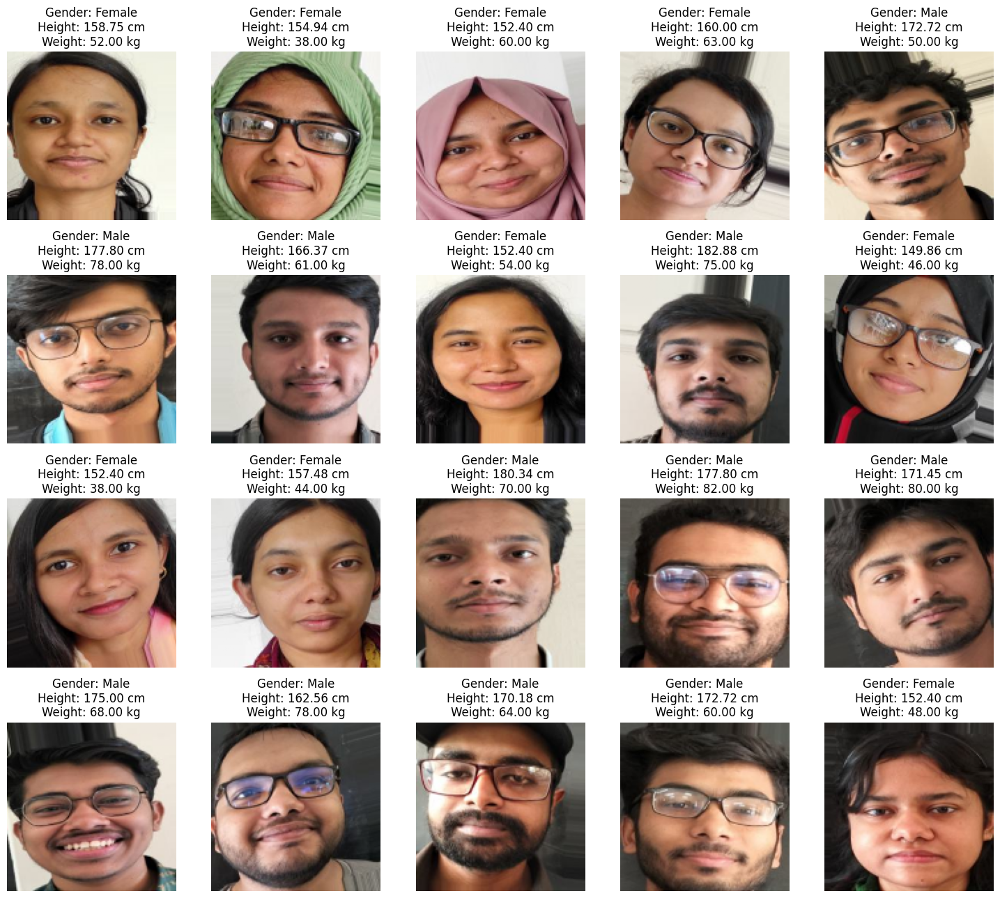

In [47]:
# Visualization code
# Starting index and the gap between images
start_index = 0
gap = 200
num_images_to_visualize = 20

# Calculate the number of rows and columns for a better layout
num_rows = 4
num_cols = 5

# Visualize the specified images with labels
plt.figure(figsize=(15, 13))
for i in range(num_images_to_visualize):
    index = start_index + i * gap
    gender_label = "Male" if Y_data[index][0] == 0 else "Female"
    height_label = f"Height: {Y_data[index][1]:.2f} cm"
    weight_label = f"Weight: {Y_data[index][2]:.2f} kg"
    
    plt.subplot(num_rows, num_cols, i + 1)
    plt.imshow(X_data[index])
    plt.title(f"Gender: {gender_label}\n{height_label}\n{weight_label}")
    plt.axis('off')

# Add space between subplots vertically
plt.subplots_adjust(hspace=0.5)

plt.tight_layout()
plt.show()


In [22]:
# Split the data into training, validation, and test sets with a 70-15-15 split
X_train, X_test, Y_train, Y_test = train_test_split(X_data, Y, test_size=0.3, random_state=42)
X_val, X_test, Y_val, Y_test = train_test_split(X_test, Y_test, test_size=0.5, random_state=42)
print("Training set size:", len(X_train))
print("Validation set size:", len(X_val))
print("Test set size:", len(X_test))


Training set size: 6300
Validation set size: 1350
Test set size: 1350


Custom Model

In [34]:
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, Flatten, Dense, BatchNormalization, Dropout, ReLU
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import ReduceLROnPlateau, EarlyStopping
import tensorflow as tf

# Define the input shape
input_shape = (128, 128, 3)

# Input layer
input_layer = Input(shape=input_shape)

# Convolutional layers with batch normalization and max pooling
x = Conv2D(64, (3, 3))(input_layer)
x = BatchNormalization()(x)
x = ReLU()(x)
x = MaxPooling2D((2, 2))(x)

x = Conv2D(128, (3, 3))(x)
x = BatchNormalization()(x)
x = ReLU()(x)
x = MaxPooling2D((2, 2))(x)

x = Conv2D(256, (3, 3))(x)
x = BatchNormalization()(x)
x = ReLU()(x)
x = MaxPooling2D((2, 2))(x)


# Flatten layer
x = Flatten()(x)

# Dense layers with dropout
x = Dense(2048)(x)
x = BatchNormalization()(x)
x = ReLU()(x)
x = Dropout(0.1)(x)  # Adjusted dropout rate

x = Dense(1024)(x)
x = BatchNormalization()(x)
x = ReLU()(x)
x = Dropout(0.1)(x)  # Adjusted dropout rate

x = Dense(1024)(x)
x = BatchNormalization()(x)
x = ReLU()(x)
x = Dropout(0.01)(x)  # Adjusted dropout rate

x = Dense(512)(x)
x = BatchNormalization()(x)
x = ReLU()(x)
x = Dropout(0.01)(x)  # Adjusted dropout rate


combined_output = Dense(3, activation='linear', name='combined_out')(x)

# Create the final model
model = Model(inputs=input_layer, outputs=combined_output)


# Define custom RMSE metric function
def rmse(y_true, y_pred):
    return tf.sqrt(tf.reduce_mean(tf.square(y_true - y_pred)))

#Define custom mean_absolute_percentage_error
def mape(y_true, y_pred):
    epsilon = 1e-0  # Small epsilon value to avoid division by zero
    y_true, y_pred = tf.squeeze(y_true), tf.squeeze(y_pred)
    return tf.reduce_mean(tf.abs((y_true - y_pred) / (y_true + epsilon))) * 100

def accuracy(y_true, y_pred):
    y_true = tf.cast(y_true, tf.double)
    y_pred = tf.cast(y_pred, tf.double)
    mape_score = mape(y_true, y_pred)
    accuracy = (100 - mape_score) / 100
    return accuracy





# Compile the model with Mean Absolute Error (MAE) as the loss function for all predictions
model.compile(
    optimizer=Adam(learning_rate=0.0002),  # Adam optimizer
    loss='mae',
    metrics=[mape, rmse, accuracy],
)

# Train the model and obtain history
history = model.fit(
    X_train,
    Y_train,
    epochs=200,
    batch_size=32,
    validation_data=(X_val, Y_val)
)

Epoch 1/200
  5/197 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - accuracy: 0.0403 - loss: 77.7022 - mape: 95.9747 - rmse: 104.0430 

W0000 00:00:1710580841.756649     131 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


197/197 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - accuracy: 0.1786 - loss: 76.1176 - mape: 82.1391 - rmse: 102.4644

W0000 00:00:1710580860.320058     130 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update
W0000 00:00:1710580861.940906     130 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


197/197 ━━━━━━━━━━━━━━━━━━━━ 38s 107ms/step - accuracy: 0.1790 - loss: 76.1087 - mape: 82.1021 - rmse: 102.4549 - val_accuracy: 0.2783 - val_loss: 74.5413 - val_mape: 72.1734 - val_rmse: 100.6172
Epoch 2/200
197/197 ━━━━━━━━━━━━━━━━━━━━ 8s 39ms/step - accuracy: 0.3760 - loss: 68.6541 - mape: 62.3985 - rmse: 94.4412 - val_accuracy: 0.4820 - val_loss: 60.2418 - val_mape: 51.7963 - val_rmse: 85.4482
Epoch 3/200
197/197 ━━━━━━━━━━━━━━━━━━━━ 8s 39ms/step - accuracy: 0.4785 - loss: 59.2393 - mape: 52.1464 - rmse: 84.3896 - val_accuracy: 0.5801 - val_loss: 50.8481 - val_mape: 41.9927 - val_rmse: 75.5762
Epoch 4/200
197/197 ━━━━━━━━━━━━━━━━━━━━ 8s 39ms/step - accuracy: 0.5992 - loss: 47.9362 - mape: 40.0820 - rmse: 72.5289 - val_accuracy: 0.6164 - val_loss: 45.6302 - val_mape: 38.3601 - val_rmse: 69.2717
Epoch 5/200
197/197 ━━━━━━━━━━━━━━━━━━━━ 8s 39ms/step - accuracy: 0.6945 - loss: 37.3101 - mape: 30.5455 - rmse: 59.7445 - val_accuracy: 0.6890 - val_loss: 35.4783 - val_mape: 31.1037 - val_rm

In [35]:
import numpy as np
import tensorflow as tf
from tensorflow.keras.losses import mean_absolute_error


# Evaluate the model on the test set
test = model.evaluate(X_test, Y_test, batch_size=32)

# Assuming gender, height, and weight are the first, second, and third columns in Y_test
y_pred = model.predict(X_test)

# Cast Y_test and y_pred to double tensors
Y_test = tf.cast(Y_test, tf.double)
y_pred = tf.cast(y_pred, tf.double)

# Compute Mean Absolute Error for gender, height, and weight
gender_test_mae = mean_absolute_error(Y_test[:, 0], y_pred[:, 0])
height_test_mae = mean_absolute_error(Y_test[:, 1], y_pred[:, 1])
weight_test_mae = mean_absolute_error(Y_test[:, 2], y_pred[:, 2])

print("Gender Test MAE:", gender_test_mae.numpy().item())
print("Height Test MAE:", height_test_mae.numpy().item())
print("Weight Test MAE:", weight_test_mae.numpy().item())

# Compute Mean Absolute Percentage Error (MAPE) for gender, height, and weight
gender_test_mape = mape(Y_test[:, 0], y_pred[:, 0])
height_test_mape = mape(Y_test[:, 1], y_pred[:, 1])
weight_test_mape = mape(Y_test[:, 2], y_pred[:, 2])

print("Gender Test MAPE:", gender_test_mape.numpy().item())
print("Height Test MAPE:", height_test_mape.numpy().item())
print("Weight Test MAPE:", weight_test_mape.numpy().item())

# Compute Root Mean Squared Error (RMSE) for gender, height, and weight
gender_test_rmse = rmse(Y_test[:, 0], y_pred[:, 0])
height_test_rmse = rmse(Y_test[:, 1], y_pred[:, 1])
weight_test_rmse = rmse(Y_test[:, 2], y_pred[:, 2])

print("Gender Test RMSE:", gender_test_rmse.numpy().item())
print("Height Test RMSE:", height_test_rmse.numpy().item())
print("Weight Test RMSE:", weight_test_rmse.numpy().item())


# Compute accuracy for gender, height, and weight 
gender_test_accuracy = accuracy(Y_test[:, 0], y_pred[:, 0])
height_test_accuracy = accuracy(Y_test[:, 1], y_pred[:, 1])
weight_test_accuracy = accuracy(Y_test[:, 2], y_pred[:, 2])

print("Gender Test Accuracy:", gender_test_accuracy.numpy().item())
print("Height Test Accuracy:", height_test_accuracy.numpy().item())
print("Weight Test Accuracy:", weight_test_accuracy.numpy().item())

43/43 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step - accuracy: 0.9850 - loss: 0.4674 - mape: 1.5018 - rmse: 0.8700
27/43 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step

W0000 00:00:1710582437.820896     130 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


43/43 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step
Gender Test MAE: 0.03884186088762902
Height Test MAE: 0.728331206597223
Weight Test MAE: 0.6035077271638093
Gender Test MAPE: 3.197253819141123
Height Test MAPE: 0.43336216592219245
Weight Test MAPE: 0.9071555468279624
Gender Test RMSE: 0.058453664101647956
Height Test RMSE: 1.0165690876091178
Weight Test RMSE: 1.1641631066975988
Gender Test Accuracy: 0.9680274618085888
Height Test Accuracy: 0.9956663783407781
Weight Test Accuracy: 0.9909284445317204


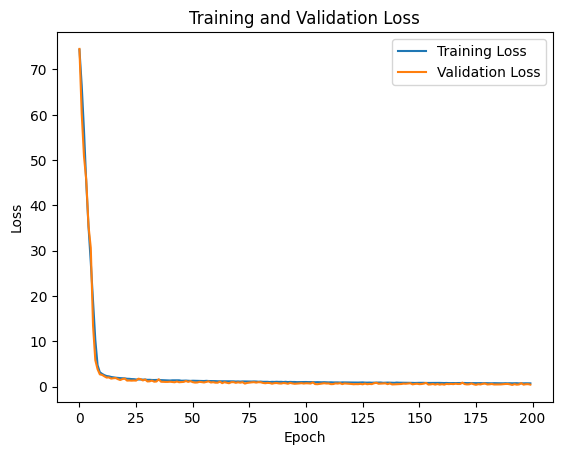

In [36]:
import matplotlib.pyplot as plt

# Plot training loss and validation loss
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.savefig('loss_plot_custom_model1.jpg', format='jpg', dpi=600)  # Save the plot as a JPG file
plt.show()

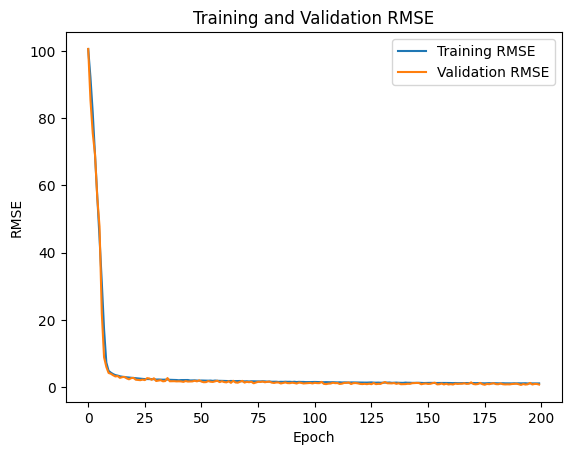

In [37]:
# Plot training RMSE and validation RMSE
plt.plot(history.history['rmse'], label='Training RMSE')
plt.plot(history.history['val_rmse'], label='Validation RMSE')
plt.title('Training and Validation RMSE')
plt.xlabel('Epoch')
plt.ylabel('RMSE')
plt.legend()
plt.savefig('rmse_plot_custom_model1.jpg', format='jpg',dpi=600)  # Save the plot as a JPG file
plt.show()

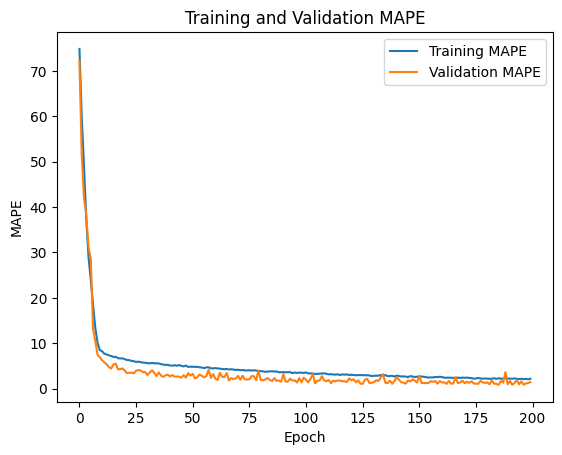

In [38]:
# Plot training MAPE and validation MAPE
plt.plot(history.history['mape'], label='Training MAPE')
plt.plot(history.history['val_mape'], label='Validation MAPE')
plt.title('Training and Validation MAPE')
plt.xlabel('Epoch')
plt.ylabel('MAPE')
plt.legend()
plt.savefig('mape_plot_custom_model1.jpg', format='jpg',dpi=600)  # Save the plot as a JPG file
plt.show()

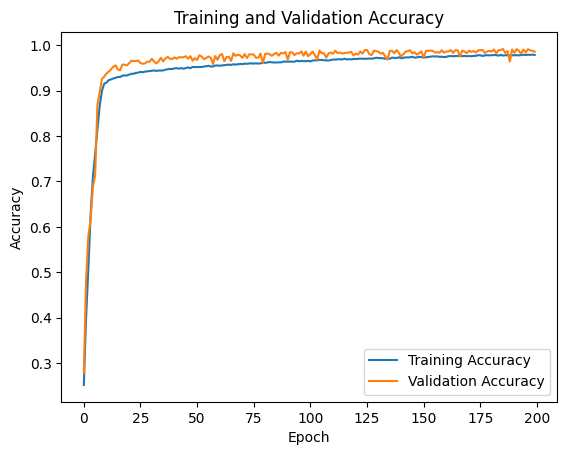

In [39]:
# Plot training Accuracy and validation Accuracy
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.savefig('accuracy_plot_custom_model1.jpg', format='jpg',dpi=600)  # Save the plot as a JPG file
plt.show()

In [32]:
import os

# Specify the filename to delete
filename = 'accuracy_plot.jpg'

# Construct the full path to the file
full_path = os.path.join(os.getcwd(), filename)

# Delete the file
os.remove(full_path)

print("Image deleted:", full_path)


Image deleted: /kaggle/working/accuracy_plot.jpg


Sample 1:
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 531ms/step
  Original - Gender: Male, Height: 177.80 cm, Weight: 78.00 kg, BMR: 1781.25 calories
  Predicted - Gender: Male, Height: 177.68 cm, Weight: 77.62 kg, BMR: 1776.74 calories



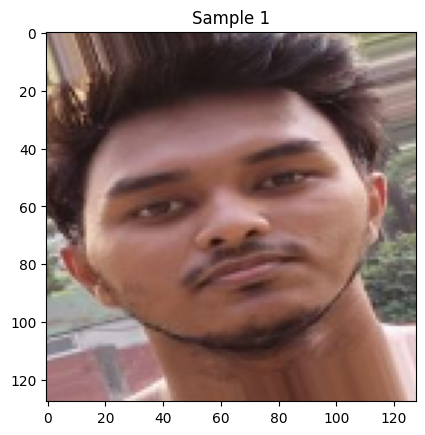

Sample 2:
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
  Original - Gender: Female, Height: 154.94 cm, Weight: 48.00 kg, BMR: 1172.38 calories
  Predicted - Gender: Female, Height: 155.77 cm, Weight: 48.70 kg, BMR: 1184.53 calories



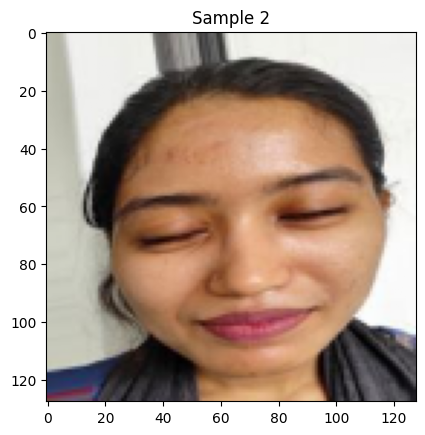

Sample 3:
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
  Original - Gender: Male, Height: 177.80 cm, Weight: 62.00 kg, BMR: 1621.25 calories
  Predicted - Gender: Male, Height: 174.50 cm, Weight: 63.66 kg, BMR: 1617.24 calories



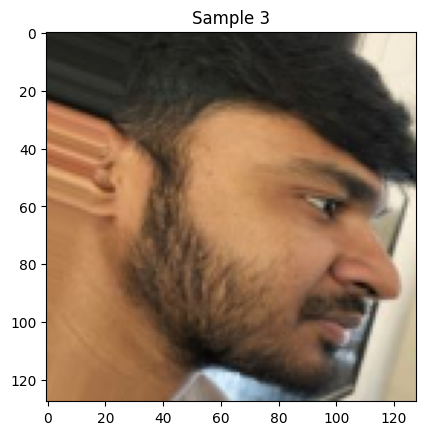

Sample 4:
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
  Original - Gender: Male, Height: 171.45 cm, Weight: 50.00 kg, BMR: 1461.56 calories
  Predicted - Gender: Male, Height: 172.02 cm, Weight: 50.54 kg, BMR: 1470.57 calories



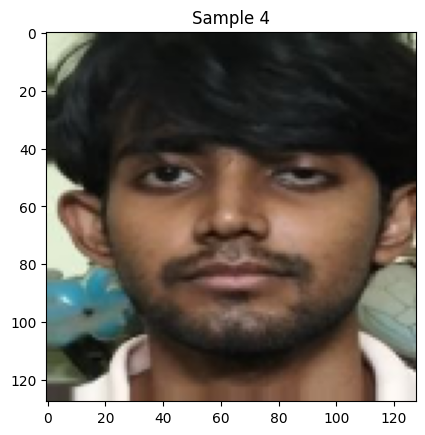

Sample 5:
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
  Original - Gender: Female, Height: 157.48 cm, Weight: 44.00 kg, BMR: 1148.25 calories
  Predicted - Gender: Female, Height: 157.39 cm, Weight: 43.99 kg, BMR: 1147.55 calories



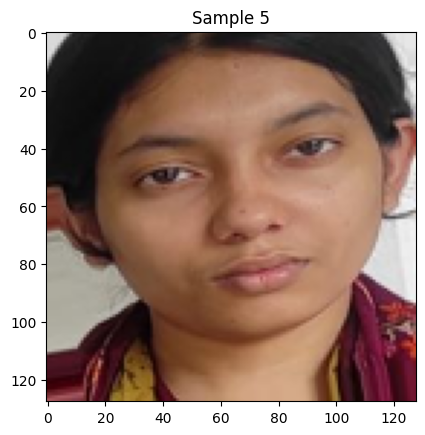

In [40]:
import numpy as np
import cv2
import pandas as pd
import os
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.layers import Flatten, Dense
from tensorflow.keras.models import Model
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt

# Define the calculate_bmr function
def calculate_bmr(gender_prob, weight, height, age):
    gender = 0 if gender_prob < 0.5 else 1
    if gender == 0:  # Assuming 0 represents Male
        bmr = 10 * weight + 6.25 * height - 5 * age + 5
    elif gender == 1:  # Assuming 1 represents Female
        bmr = 10 * weight + 6.25 * height - 5 * age - 161
    else:
        raise ValueError("Invalid gender value. Use 0 for Male, 1 for Female.")
    return bmr

# Lists to store original and predicted BMR, gender, height, and weight values
original_values_list = []
predicted_values_list = []

# Fixed age for calculation
age_for_calculation = 23

# Display original and predicted values for BMR, gender, height, and weight
for i in range(5):  # Adjust the number based on your preference
    print(f"Sample {i + 1}:")

    # Original values
    original_gender = "Male" if Y_test[i, 0] == 0 else "Female"
    original_height = Y_test[i, 1]
    original_weight = Y_test[i, 2]
    original_bmr = calculate_bmr(Y_test[i, 0], original_weight, original_height, age_for_calculation)

    original_values_list.append({
        'Gender': original_gender,
        'Height': original_height,
        'Weight': original_weight,
        'BMR': original_bmr
    })

    # Predicted values from your model
    predictions = model.predict(np.expand_dims(X_test[i], axis=0))
    predicted_gender_prob = predictions[0, 0]
    predicted_gender = "Male" if predicted_gender_prob < 0.5 else "Female"
    predicted_height = predictions[0, 1]
    predicted_weight = predictions[0, 2]

    # Calculate predicted BMR using predicted gender probability, height, weight, and fixed age
    predicted_bmr = calculate_bmr(predicted_gender_prob, predicted_weight, predicted_height, age_for_calculation)

    predicted_values_list.append({
        'Gender': predicted_gender,
        'Height': predicted_height,
        'Weight': predicted_weight,
        'BMR': predicted_bmr
    })

    # Display original and predicted values
    print(f"  Original - Gender: {original_gender}, Height: {original_height:.2f} cm, Weight: {original_weight:.2f} kg, BMR: {original_bmr:.2f} calories")
    print(f"  Predicted - Gender: {predicted_gender}, Height: {predicted_height:.2f} cm, Weight: {predicted_weight:.2f} kg, BMR: {predicted_bmr:.2f} calories")
    print()

    # Display the image
    plt.imshow(X_test[i])
    plt.title(f"Sample {i + 1}")
    plt.show()


ResNet50

In [49]:
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, Flatten, Dense, BatchNormalization, Dropout, ReLU
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import ReduceLROnPlateau, EarlyStopping
import tensorflow as tf

from tensorflow.keras.applications import ResNet50

# Define the input shape
input_shape = (128, 128, 3)

# Load the ResNet50 base model pretrained on ImageNet
resnet50_base = ResNet50(weights='imagenet', include_top=False, input_shape=input_shape)
resnet50_base.trainable = False

# Create a new model by adding a single dense layer for gender, height, and weight prediction
x = Flatten()(resnet50_base.output)
combined_output = Dense(3, activation='linear', name='combined_out')(x)

# Create the final model
model = Model(inputs=resnet50_base.input, outputs=combined_output)


# Define custom RMSE metric function
def rmse(y_true, y_pred):
    return tf.sqrt(tf.reduce_mean(tf.square(y_true - y_pred)))

#Define custom mean_absolute_percentage_error
def mape(y_true, y_pred):
    epsilon = 1e-0  # Small epsilon value to avoid division by zero
    y_true, y_pred = tf.squeeze(y_true), tf.squeeze(y_pred)
    return tf.reduce_mean(tf.abs((y_true - y_pred) / (y_true + epsilon))) * 100

def accuracy(y_true, y_pred):
    y_true = tf.cast(y_true, tf.double)
    y_pred = tf.cast(y_pred, tf.double)
    mape_score = mape(y_true, y_pred)
    accuracy = (100 - mape_score) / 100
    return accuracy





# Compile the model with Mean Absolute Error (MAE) as the loss function for all predictions
model.compile(
    optimizer=Adam(learning_rate=0.0002),  # Adam optimizer
    loss='mae',
    metrics=[mape, rmse, accuracy],
)

# Train the model and obtain history
history = model.fit(
    X_train,
    Y_train,
    epochs=200,
    batch_size=32,
    validation_data=(X_val, Y_val)
)

Epoch 1/200
197/197 ━━━━━━━━━━━━━━━━━━━━ 26s 78ms/step - accuracy: 0.3485 - loss: 70.7625 - mape: 65.1548 - rmse: 96.6114 - val_accuracy: 0.5800 - val_loss: 49.5008 - val_mape: 41.9989 - val_rmse: 73.8907
Epoch 2/200
197/197 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - accuracy: 0.6389 - loss: 44.1651 - mape: 36.1132 - rmse: 67.4655 - val_accuracy: 0.7297 - val_loss: 31.2319 - val_mape: 27.0287 - val_rmse: 48.5411
Epoch 3/200
197/197 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - accuracy: 0.7509 - loss: 27.8800 - mape: 24.9127 - rmse: 42.8741 - val_accuracy: 0.8161 - val_loss: 17.0507 - val_mape: 18.3853 - val_rmse: 25.0250
Epoch 4/200
197/197 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - accuracy: 0.8350 - loss: 13.8471 - mape: 16.4952 - rmse: 20.0676 - val_accuracy: 0.8802 - val_loss: 6.7730 - val_mape: 11.9825 - val_rmse: 9.8368
Epoch 5/200
197/197 ━━━━━━━━━━━━━━━━━━━━ 6s 28ms/step - accuracy: 0.8806 - loss: 6.4999 - mape: 11.9375 - rmse: 9.5186 - val_accuracy: 0.8779 - val_loss: 6.3203 - val_mape: 12.2139 - va

In [50]:
import numpy as np
import tensorflow as tf
from tensorflow.keras.losses import mean_absolute_error


# Evaluate the model on the test set
test = model.evaluate(X_test, Y_test, batch_size=32)

# Assuming gender, height, and weight are the first, second, and third columns in Y_test
y_pred = model.predict(X_test)

# Cast Y_test and y_pred to double tensors
Y_test = tf.cast(Y_test, tf.double)
y_pred = tf.cast(y_pred, tf.double)

# Compute Mean Absolute Error for gender, height, and weight
gender_test_mae = mean_absolute_error(Y_test[:, 0], y_pred[:, 0])
height_test_mae = mean_absolute_error(Y_test[:, 1], y_pred[:, 1])
weight_test_mae = mean_absolute_error(Y_test[:, 2], y_pred[:, 2])

print("Gender Test MAE:", gender_test_mae.numpy().item())
print("Height Test MAE:", height_test_mae.numpy().item())
print("Weight Test MAE:", weight_test_mae.numpy().item())

# Compute Mean Absolute Percentage Error (MAPE) for gender, height, and weight
gender_test_mape = mape(Y_test[:, 0], y_pred[:, 0])
height_test_mape = mape(Y_test[:, 1], y_pred[:, 1])
weight_test_mape = mape(Y_test[:, 2], y_pred[:, 2])

print("Gender Test MAPE:", gender_test_mape.numpy().item())
print("Height Test MAPE:", height_test_mape.numpy().item())
print("Weight Test MAPE:", weight_test_mape.numpy().item())

# Compute Root Mean Squared Error (RMSE) for gender, height, and weight
gender_test_rmse = rmse(Y_test[:, 0], y_pred[:, 0])
height_test_rmse = rmse(Y_test[:, 1], y_pred[:, 1])
weight_test_rmse = rmse(Y_test[:, 2], y_pred[:, 2])

print("Gender Test RMSE:", gender_test_rmse.numpy().item())
print("Height Test RMSE:", height_test_rmse.numpy().item())
print("Weight Test RMSE:", weight_test_rmse.numpy().item())


# Compute accuracy for gender, height, and weight 
gender_test_accuracy = accuracy(Y_test[:, 0], y_pred[:, 0])
height_test_accuracy = accuracy(Y_test[:, 1], y_pred[:, 1])
weight_test_accuracy = accuracy(Y_test[:, 2], y_pred[:, 2])

print("Gender Test Accuracy:", gender_test_accuracy.numpy().item())
print("Height Test Accuracy:", height_test_accuracy.numpy().item())
print("Weight Test Accuracy:", weight_test_accuracy.numpy().item())

43/43 ━━━━━━━━━━━━━━━━━━━━ 1s 23ms/step - accuracy: 0.9116 - loss: 4.3866 - mape: 8.8374 - rmse: 7.0818
43/43 ━━━━━━━━━━━━━━━━━━━━ 9s 120ms/step
Gender Test MAE: 0.16557998090551268
Height Test MAE: 4.936256933593751
Weight Test MAE: 7.729016053941515
Gender Test MAPE: 11.610639388207346
Height Test MAPE: 2.9355192270305537
Weight Test MAPE: 11.820889944899248
Gender Test RMSE: 0.25755118755440937
Height Test RMSE: 6.283556073717593
Weight Test RMSE: 10.337688193703306
Gender Test Accuracy: 0.8838936061179266
Height Test Accuracy: 0.9706448077296944
Weight Test Accuracy: 0.8817911005510075


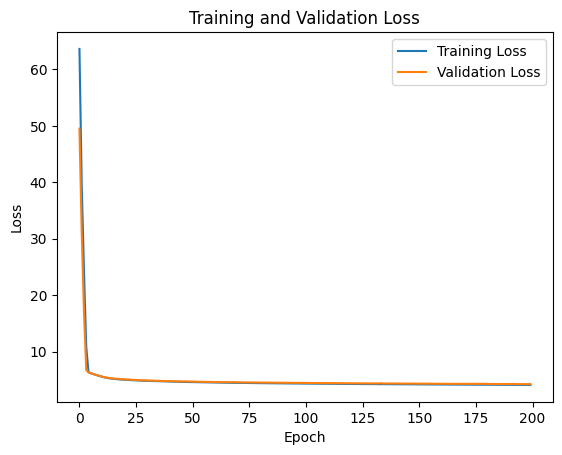

In [51]:
import matplotlib.pyplot as plt

# Plot training loss and validation loss
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.savefig('loss_plot_resnet50.jpg', format='jpg',dpi=600)  # Save the plot as a JPG file
plt.show()

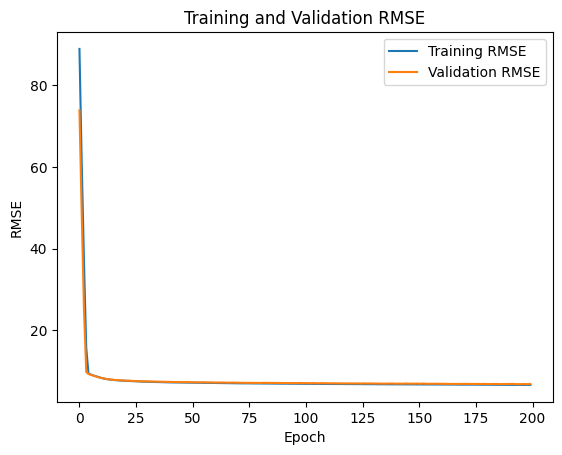

In [52]:
# Plot training RMSE and validation RMSE
plt.plot(history.history['rmse'], label='Training RMSE')
plt.plot(history.history['val_rmse'], label='Validation RMSE')
plt.title('Training and Validation RMSE')
plt.xlabel('Epoch')
plt.ylabel('RMSE')
plt.legend()
plt.savefig('rmse_plot_resnet50.jpg', format='jpg',dpi=600)  # Save the plot as a JPG file
plt.show()

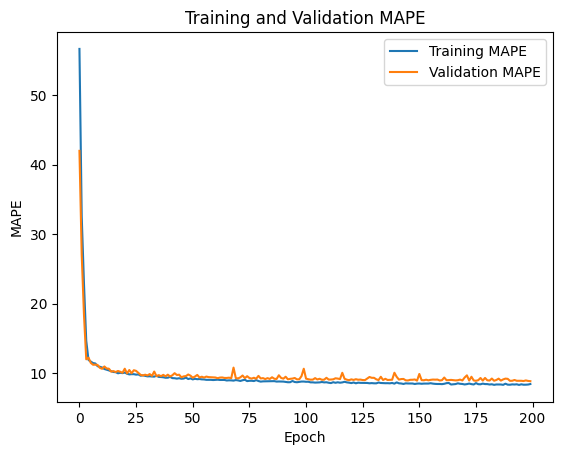

In [53]:
# Plot training MAPE and validation MAPE
plt.plot(history.history['mape'], label='Training MAPE')
plt.plot(history.history['val_mape'], label='Validation MAPE')
plt.title('Training and Validation MAPE')
plt.xlabel('Epoch')
plt.ylabel('MAPE')
plt.legend()
plt.savefig('mape_plot_resnet50.jpg', format='jpg',dpi=600)  # Save the plot as a JPG file
plt.show()

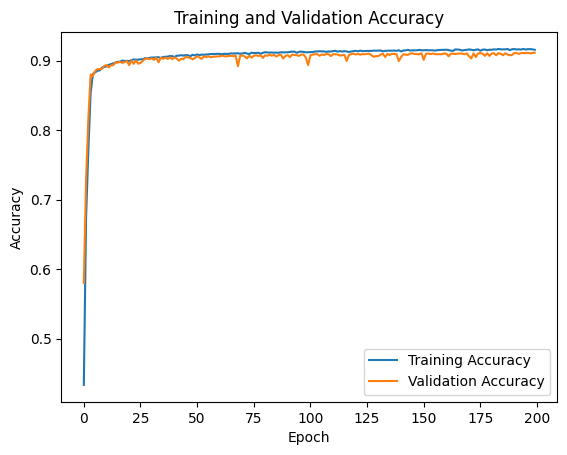

In [54]:
# Plot training Accuracy and validation Accuracy
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.savefig('accuracy_plot_resnet50.jpg', format='jpg',dpi=600)  # Save the plot as a JPG file
plt.show()

Sample 1:
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
  Original - Gender: Male, Height: 177.80 cm, Weight: 78.00 kg, BMR: 1781.25 calories
  Predicted - Gender: Male, Height: 169.05 cm, Weight: 67.50 kg, BMR: 1621.60 calories



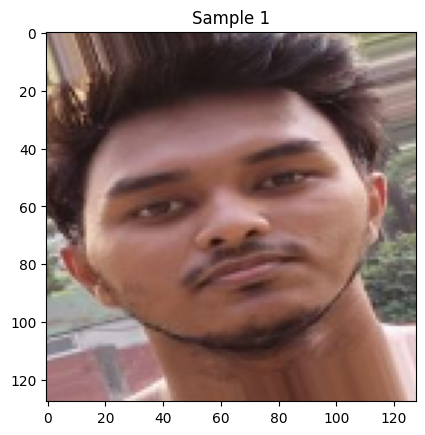

Sample 2:
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
  Original - Gender: Female, Height: 154.94 cm, Weight: 48.00 kg, BMR: 1172.38 calories
  Predicted - Gender: Female, Height: 156.33 cm, Weight: 47.85 kg, BMR: 1179.52 calories



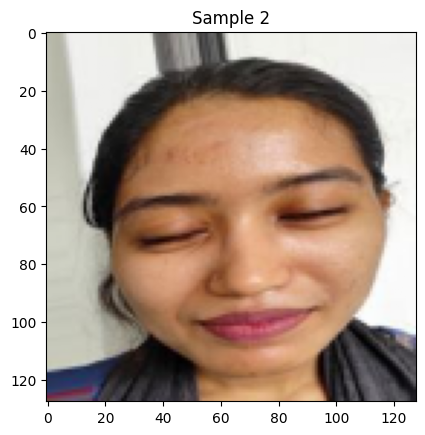

Sample 3:
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
  Original - Gender: Male, Height: 177.80 cm, Weight: 62.00 kg, BMR: 1621.25 calories
  Predicted - Gender: Male, Height: 169.84 cm, Weight: 63.87 kg, BMR: 1590.14 calories



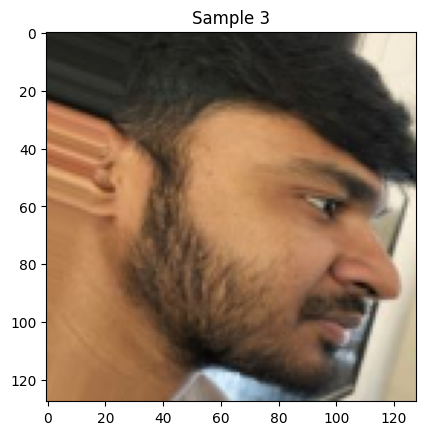

Sample 4:
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
  Original - Gender: Male, Height: 171.45 cm, Weight: 50.00 kg, BMR: 1461.56 calories
  Predicted - Gender: Male, Height: 169.70 cm, Weight: 56.75 kg, BMR: 1518.11 calories



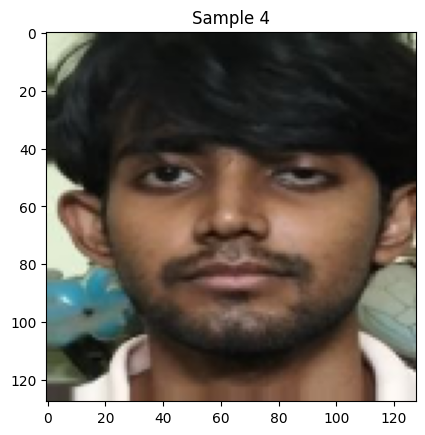

Sample 5:
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
  Original - Gender: Female, Height: 157.48 cm, Weight: 44.00 kg, BMR: 1148.25 calories
  Predicted - Gender: Female, Height: 160.36 cm, Weight: 56.16 kg, BMR: 1287.90 calories



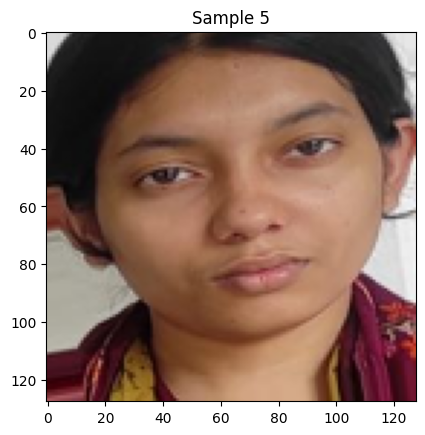

In [55]:
import numpy as np
import cv2
import pandas as pd
import os
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.layers import Flatten, Dense
from tensorflow.keras.models import Model
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt

# Define the calculate_bmr function
def calculate_bmr(gender_prob, weight, height, age):
    gender = 0 if gender_prob < 0.5 else 1
    if gender == 0:  # Assuming 0 represents Male
        bmr = 10 * weight + 6.25 * height - 5 * age + 5
    elif gender == 1:  # Assuming 1 represents Female
        bmr = 10 * weight + 6.25 * height - 5 * age - 161
    else:
        raise ValueError("Invalid gender value. Use 0 for Male, 1 for Female.")
    return bmr

# Lists to store original and predicted BMR, gender, height, and weight values
original_values_list = []
predicted_values_list = []

# Fixed age for calculation
age_for_calculation = 23

# Display original and predicted values for BMR, gender, height, and weight
for i in range(5):  # Adjust the number based on your preference
    print(f"Sample {i + 1}:")

    # Original values
    original_gender = "Male" if Y_test[i, 0] == 0 else "Female"
    original_height = Y_test[i, 1]
    original_weight = Y_test[i, 2]
    original_bmr = calculate_bmr(Y_test[i, 0], original_weight, original_height, age_for_calculation)

    original_values_list.append({
        'Gender': original_gender,
        'Height': original_height,
        'Weight': original_weight,
        'BMR': original_bmr
    })

    # Predicted values from your model
    predictions = model.predict(np.expand_dims(X_test[i], axis=0))
    predicted_gender_prob = predictions[0, 0]
    predicted_gender = "Male" if predicted_gender_prob < 0.5 else "Female"
    predicted_height = predictions[0, 1]
    predicted_weight = predictions[0, 2]

    # Calculate predicted BMR using predicted gender probability, height, weight, and fixed age
    predicted_bmr = calculate_bmr(predicted_gender_prob, predicted_weight, predicted_height, age_for_calculation)

    predicted_values_list.append({
        'Gender': predicted_gender,
        'Height': predicted_height,
        'Weight': predicted_weight,
        'BMR': predicted_bmr
    })

    # Display original and predicted values
    print(f"  Original - Gender: {original_gender}, Height: {original_height:.2f} cm, Weight: {original_weight:.2f} kg, BMR: {original_bmr:.2f} calories")
    print(f"  Predicted - Gender: {predicted_gender}, Height: {predicted_height:.2f} cm, Weight: {predicted_weight:.2f} kg, BMR: {predicted_bmr:.2f} calories")
    print()

    # Display the image
    plt.imshow(X_test[i])
    plt.title(f"Sample {i + 1}")
    plt.show()


Vgg16

In [56]:
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, Flatten, Dense, BatchNormalization, Dropout, ReLU
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import ReduceLROnPlateau, EarlyStopping
import tensorflow as tf

#Vgg16
from tensorflow.keras.applications import VGG16
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense, Flatten
from tensorflow.keras.optimizers import Adam

# Define the input shape
input_shape = (128, 128, 3)

# Load the VGG16 base model pretrained on ImageNet
vgg16_base = VGG16(weights='imagenet', include_top=False, input_shape=input_shape)
vgg16_base.trainable = False

# Create a new model by adding a single dense layer for gender, height, and weight prediction
x = Flatten()(vgg16_base.output)
combined_output = Dense(3, activation='linear', name='combined_out')(x)

# Create the final model
model = Model(inputs=vgg16_base.input, outputs=combined_output)


# Define custom RMSE metric function
def rmse(y_true, y_pred):
    return tf.sqrt(tf.reduce_mean(tf.square(y_true - y_pred)))

#Define custom mean_absolute_percentage_error
def mape(y_true, y_pred):
    epsilon = 1e-0  # Small epsilon value to avoid division by zero
    y_true, y_pred = tf.squeeze(y_true), tf.squeeze(y_pred)
    return tf.reduce_mean(tf.abs((y_true - y_pred) / (y_true + epsilon))) * 100

def accuracy(y_true, y_pred):
    y_true = tf.cast(y_true, tf.double)
    y_pred = tf.cast(y_pred, tf.double)
    mape_score = mape(y_true, y_pred)
    accuracy = (100 - mape_score) / 100
    return accuracy





# Compile the model with Mean Absolute Error (MAE) as the loss function for all predictions
model.compile(
    optimizer=Adam(learning_rate=0.0002),  # Adam optimizer
    loss='mae',
    metrics=[mape, rmse, accuracy],
)

# Train the model and obtain history
history = model.fit(
    X_train,
    Y_train,
    epochs=200,
    batch_size=32,
    validation_data=(X_val, Y_val)
)

58889256/58889256 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
Epoch 1/200


2024-03-16 10:38:57.434800: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 0: 4.34782, expected 3.51669
2024-03-16 10:38:57.434872: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 1: 6.71977, expected 5.88864
2024-03-16 10:38:57.434889: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 2: 6.95696, expected 6.12583
2024-03-16 10:38:57.434902: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 3: 6.48105, expected 5.64992
2024-03-16 10:38:57.434915: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 4: 5.32797, expected 4.49684
2024-03-16 10:38:57.434927: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 5: 5.7497, expected 4.91857
2024-03-16 10:38:57.434941: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 6: 6.01592, expected 5.18479
2024-03-16 10:38:57.434955: E external/local_xla/xla/ser

195/197 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - accuracy: 0.3655 - loss: 67.2422 - mape: 63.4545 - rmse: 93.1045

2024-03-16 10:39:09.593865: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 0: 2.7918, expected 2.26134
2024-03-16 10:39:09.593932: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 3: 4.06742, expected 3.53696
2024-03-16 10:39:09.593943: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 4: 3.91644, expected 3.38598
2024-03-16 10:39:09.593952: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 5: 3.77911, expected 3.24865
2024-03-16 10:39:09.593961: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 6: 3.66919, expected 3.13873
2024-03-16 10:39:09.593971: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 7: 3.17729, expected 2.64683
2024-03-16 10:39:09.593979: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 8: 3.11076, expected 2.5803
2024-03-16 10:39:09.593988: E external/local_xla/xla/serv

197/197 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step - accuracy: 0.3667 - loss: 67.1442 - mape: 63.3345 - rmse: 92.9986

2024-03-16 10:39:18.669214: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 49152: 4.04483, expected 3.29109
2024-03-16 10:39:18.669287: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 49153: 6.15577, expected 5.40203
2024-03-16 10:39:18.669298: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 49154: 5.53923, expected 4.78549
2024-03-16 10:39:18.669307: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 49155: 5.13236, expected 4.37862
2024-03-16 10:39:18.669316: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 49156: 5.05401, expected 4.30027
2024-03-16 10:39:18.669325: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 49157: 4.94186, expected 4.18812
2024-03-16 10:39:18.669334: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 49158: 4.28033, expected 3.52659
2024-03-16 10:39:18.669343:

197/197 ━━━━━━━━━━━━━━━━━━━━ 26s 87ms/step - accuracy: 0.3672 - loss: 67.0956 - mape: 63.2754 - rmse: 92.9461 - val_accuracy: 0.2035 - val_loss: 72.0732 - val_mape: 79.6536 - val_rmse: 101.8000
Epoch 2/200
197/197 ━━━━━━━━━━━━━━━━━━━━ 6s 31ms/step - accuracy: 0.7071 - loss: 34.7660 - mape: 29.2931 - rmse: 54.4165 - val_accuracy: 0.1764 - val_loss: 71.2038 - val_mape: 82.3612 - val_rmse: 96.1441
Epoch 3/200
197/197 ━━━━━━━━━━━━━━━━━━━━ 6s 31ms/step - accuracy: 0.8392 - loss: 14.7959 - mape: 16.0795 - rmse: 22.4172 - val_accuracy: 0.2217 - val_loss: 71.6162 - val_mape: 77.8264 - val_rmse: 98.3345
Epoch 4/200
197/197 ━━━━━━━━━━━━━━━━━━━━ 6s 31ms/step - accuracy: 0.8968 - loss: 6.6420 - mape: 10.3156 - rmse: 10.3433 - val_accuracy: 0.1981 - val_loss: 71.2655 - val_mape: 80.1905 - val_rmse: 97.8557
Epoch 5/200
197/197 ━━━━━━━━━━━━━━━━━━━━ 6s 31ms/step - accuracy: 0.9067 - loss: 6.0963 - mape: 9.3271 - rmse: 9.6057 - val_accuracy: 0.2095 - val_loss: 70.6644 - val_mape: 79.0502 - val_rmse: 96

In [57]:
import numpy as np
import tensorflow as tf
from tensorflow.keras.losses import mean_absolute_error


# Evaluate the model on the test set
test = model.evaluate(X_test, Y_test, batch_size=32)

# Assuming gender, height, and weight are the first, second, and third columns in Y_test
y_pred = model.predict(X_test)

# Cast Y_test and y_pred to double tensors
Y_test = tf.cast(Y_test, tf.double)
y_pred = tf.cast(y_pred, tf.double)

# Compute Mean Absolute Error for gender, height, and weight
gender_test_mae = mean_absolute_error(Y_test[:, 0], y_pred[:, 0])
height_test_mae = mean_absolute_error(Y_test[:, 1], y_pred[:, 1])
weight_test_mae = mean_absolute_error(Y_test[:, 2], y_pred[:, 2])

print("Gender Test MAE:", gender_test_mae.numpy().item())
print("Height Test MAE:", height_test_mae.numpy().item())
print("Weight Test MAE:", weight_test_mae.numpy().item())

# Compute Mean Absolute Percentage Error (MAPE) for gender, height, and weight
gender_test_mape = mape(Y_test[:, 0], y_pred[:, 0])
height_test_mape = mape(Y_test[:, 1], y_pred[:, 1])
weight_test_mape = mape(Y_test[:, 2], y_pred[:, 2])

print("Gender Test MAPE:", gender_test_mape.numpy().item())
print("Height Test MAPE:", height_test_mape.numpy().item())
print("Weight Test MAPE:", weight_test_mape.numpy().item())

# Compute Root Mean Squared Error (RMSE) for gender, height, and weight
gender_test_rmse = rmse(Y_test[:, 0], y_pred[:, 0])
height_test_rmse = rmse(Y_test[:, 1], y_pred[:, 1])
weight_test_rmse = rmse(Y_test[:, 2], y_pred[:, 2])

print("Gender Test RMSE:", gender_test_rmse.numpy().item())
print("Height Test RMSE:", height_test_rmse.numpy().item())
print("Weight Test RMSE:", weight_test_rmse.numpy().item())


# Compute accuracy for gender, height, and weight 
gender_test_accuracy = accuracy(Y_test[:, 0], y_pred[:, 0])
height_test_accuracy = accuracy(Y_test[:, 1], y_pred[:, 1])
weight_test_accuracy = accuracy(Y_test[:, 2], y_pred[:, 2])

print("Gender Test Accuracy:", gender_test_accuracy.numpy().item())
print("Height Test Accuracy:", height_test_accuracy.numpy().item())
print("Weight Test Accuracy:", weight_test_accuracy.numpy().item())

43/43 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - accuracy: 0.9129 - loss: 4.8884 - mape: 8.7091 - rmse: 7.0427
43/43 ━━━━━━━━━━━━━━━━━━━━ 2s 33ms/step
Gender Test MAE: 0.2932602524453843
Height Test MAE: 27.659081238245076
Weight Test MAE: 17.447196853072555
Gender Test MAPE: 25.966445486026778
Height Test MAPE: 16.312123634402496
Weight Test MAPE: 25.509152708715927
Gender Test RMSE: 3.3732242032096806
Height Test RMSE: 385.3232496756084
Weight Test RMSE: 220.83768415581355
Gender Test Accuracy: 0.7403355451397323
Height Test Accuracy: 0.836878763655975
Weight Test Accuracy: 0.7449084729128407


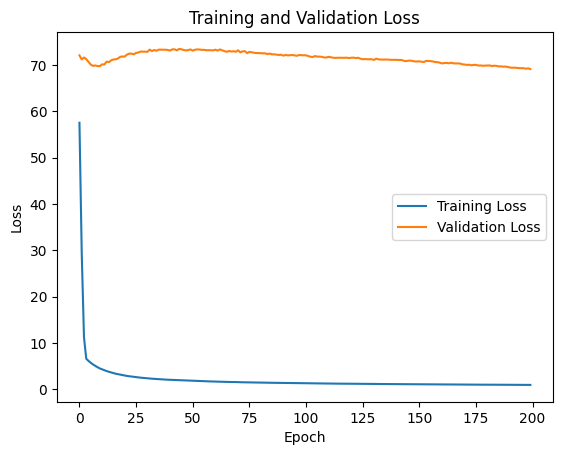

In [58]:
import matplotlib.pyplot as plt

# Plot training loss and validation loss
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.savefig('loss_plot_vgg16.jpg', format='jpg',dpi=600)  # Save the plot as a JPG file
plt.show()


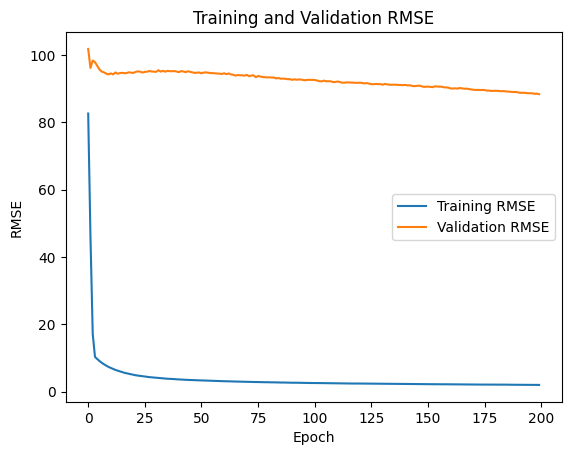

In [59]:
# Plot training RMSE and validation RMSE
plt.plot(history.history['rmse'], label='Training RMSE')
plt.plot(history.history['val_rmse'], label='Validation RMSE')
plt.title('Training and Validation RMSE')
plt.xlabel('Epoch')
plt.ylabel('RMSE')
plt.legend()
plt.savefig('rmse_plot_vgg16.jpg', format='jpg',dpi=600)  # Save the plot as a JPG file
plt.show()

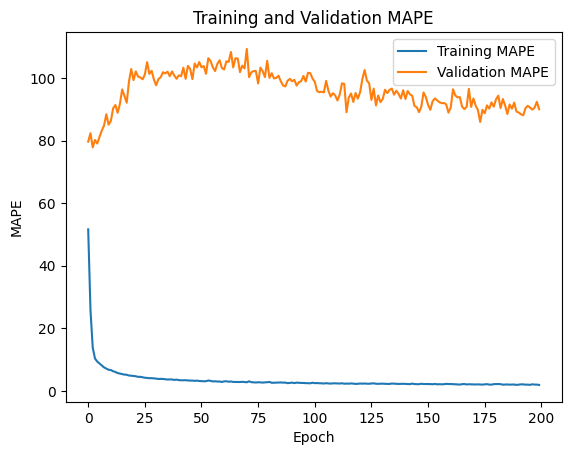

In [60]:
# Plot training MAPE and validation MAPE
plt.plot(history.history['mape'], label='Training MAPE')
plt.plot(history.history['val_mape'], label='Validation MAPE')
plt.title('Training and Validation MAPE')
plt.xlabel('Epoch')
plt.ylabel('MAPE')
plt.legend()
plt.savefig('mape_plot_vgg16.jpg', format='jpg',dpi=600)  # Save the plot as a JPG file
plt.show()

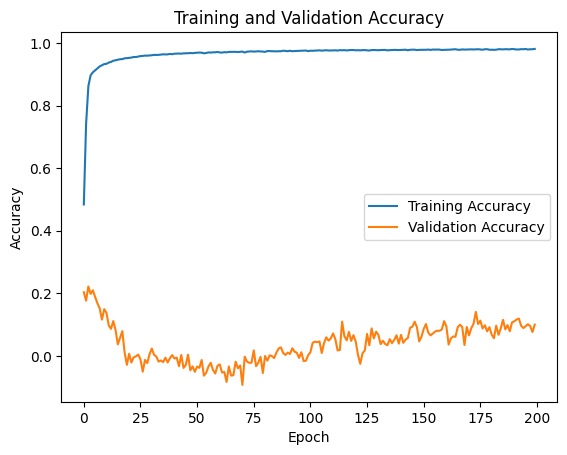

In [61]:
# Plot training Accuracy and validation Accuracy
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.savefig('accuracy_plot_vgg16.jpg', format='jpg',dpi=600)  # Save the plot as a JPG file
plt.show()

Sample 1:


2024-03-16 11:07:33.056554: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 32768: 3.66788, expected 2.82077
2024-03-16 11:07:33.056617: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 32769: 5.27059, expected 4.42348
2024-03-16 11:07:33.056629: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 32770: 5.00058, expected 4.15347
2024-03-16 11:07:33.056641: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 32771: 4.72297, expected 3.87586
2024-03-16 11:07:33.056650: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 32772: 4.5861, expected 3.73899
2024-03-16 11:07:33.056660: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 32773: 4.17555, expected 3.32844
2024-03-16 11:07:33.056669: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 32774: 3.43326, expected 2.58615
2024-03-16 11:07:33.056678: 

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
  Original - Gender: Male, Height: 177.80 cm, Weight: 78.00 kg, BMR: 1781.25 calories
  Predicted - Gender: Male, Height: 363405.28 cm, Weight: 54210.15 kg, BMR: 2813274.49 calories



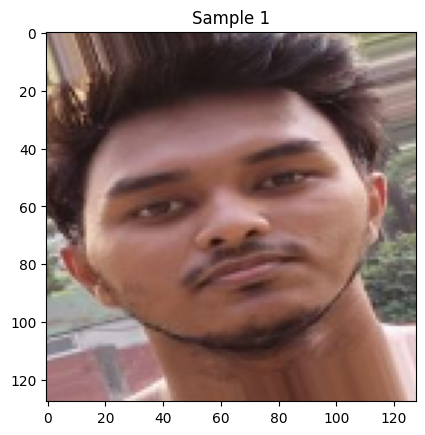

Sample 2:
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
  Original - Gender: Female, Height: 154.94 cm, Weight: 48.00 kg, BMR: 1172.38 calories
  Predicted - Gender: Female, Height: 419134.66 cm, Weight: 11122.54 kg, BMR: 2730541.00 calories



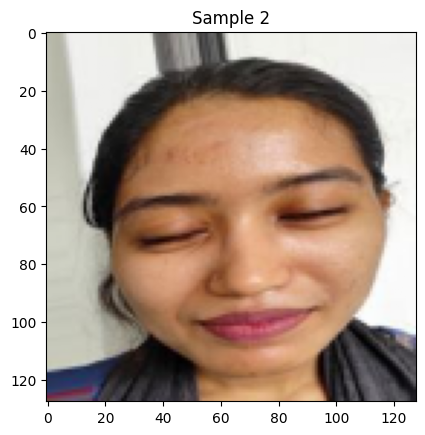

Sample 3:
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
  Original - Gender: Male, Height: 177.80 cm, Weight: 62.00 kg, BMR: 1621.25 calories
  Predicted - Gender: Male, Height: 212939.80 cm, Weight: 41481.43 kg, BMR: 1745578.07 calories



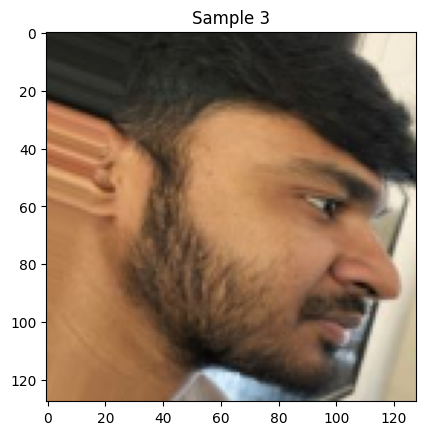

Sample 4:
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
  Original - Gender: Male, Height: 171.45 cm, Weight: 50.00 kg, BMR: 1461.56 calories
  Predicted - Gender: Male, Height: 153658.91 cm, Weight: 16437.31 kg, BMR: 1124631.23 calories



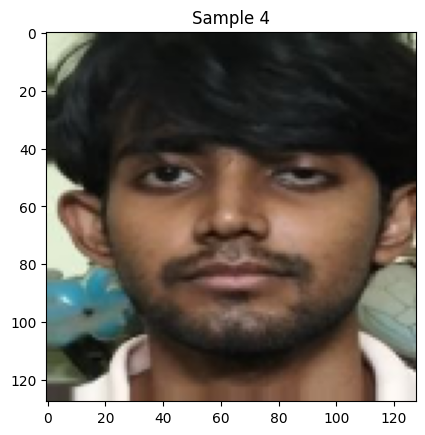

Sample 5:
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
  Original - Gender: Female, Height: 157.48 cm, Weight: 44.00 kg, BMR: 1148.25 calories
  Predicted - Gender: Male, Height: 322462.94 cm, Weight: 26486.77 kg, BMR: 2280151.07 calories



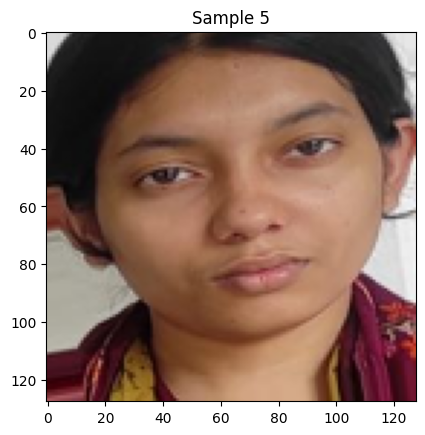

In [62]:
import numpy as np
import cv2
import pandas as pd
import os
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.layers import Flatten, Dense
from tensorflow.keras.models import Model
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt

# Define the calculate_bmr function
def calculate_bmr(gender_prob, weight, height, age):
    gender = 0 if gender_prob < 0.5 else 1
    if gender == 0:  # Assuming 0 represents Male
        bmr = 10 * weight + 6.25 * height - 5 * age + 5
    elif gender == 1:  # Assuming 1 represents Female
        bmr = 10 * weight + 6.25 * height - 5 * age - 161
    else:
        raise ValueError("Invalid gender value. Use 0 for Male, 1 for Female.")
    return bmr

# Lists to store original and predicted BMR, gender, height, and weight values
original_values_list = []
predicted_values_list = []

# Fixed age for calculation
age_for_calculation = 23

# Display original and predicted values for BMR, gender, height, and weight
for i in range(5):  # Adjust the number based on your preference
    print(f"Sample {i + 1}:")

    # Original values
    original_gender = "Male" if Y_test[i, 0] == 0 else "Female"
    original_height = Y_test[i, 1]
    original_weight = Y_test[i, 2]
    original_bmr = calculate_bmr(Y_test[i, 0], original_weight, original_height, age_for_calculation)

    original_values_list.append({
        'Gender': original_gender,
        'Height': original_height,
        'Weight': original_weight,
        'BMR': original_bmr
    })

    # Predicted values from your model
    predictions = model.predict(np.expand_dims(X_test[i], axis=0))
    predicted_gender_prob = predictions[0, 0]
    predicted_gender = "Male" if predicted_gender_prob < 0.5 else "Female"
    predicted_height = predictions[0, 1]
    predicted_weight = predictions[0, 2]

    # Calculate predicted BMR using predicted gender probability, height, weight, and fixed age
    predicted_bmr = calculate_bmr(predicted_gender_prob, predicted_weight, predicted_height, age_for_calculation)

    predicted_values_list.append({
        'Gender': predicted_gender,
        'Height': predicted_height,
        'Weight': predicted_weight,
        'BMR': predicted_bmr
    })

    # Display original and predicted values
    print(f"  Original - Gender: {original_gender}, Height: {original_height:.2f} cm, Weight: {original_weight:.2f} kg, BMR: {original_bmr:.2f} calories")
    print(f"  Predicted - Gender: {predicted_gender}, Height: {predicted_height:.2f} cm, Weight: {predicted_weight:.2f} kg, BMR: {predicted_bmr:.2f} calories")
    print()

    # Display the image
    plt.imshow(X_test[i])
    plt.title(f"Sample {i + 1}")
    plt.show()


Inception V3

In [8]:
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, Flatten, Dense, BatchNormalization, Dropout, ReLU
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import ReduceLROnPlateau, EarlyStopping
import tensorflow as tf
from tensorflow.keras.applications import InceptionV3

# Define the input shape
input_shape = (128, 128, 3)

# Load the InceptionV3 base model pretrained on ImageNet
inceptionv3_base = InceptionV3(weights='imagenet', include_top=False, input_shape=input_shape)
inceptionv3_base.trainable = False

# Create a new model by adding a single dense layer for gender, height, and weight prediction
x = Flatten()(inceptionv3_base.output)
combined_output = Dense(3, activation='linear', name='combined_out')(x)

# Create the final model
model = Model(inputs=inceptionv3_base.input, outputs=combined_output)
# Define custom RMSE metric function
def rmse(y_true, y_pred):
    return tf.sqrt(tf.reduce_mean(tf.square(y_true - y_pred)))

#Define custom mean_absolute_percentage_error
def mape(y_true, y_pred):
    epsilon = 1e-0  # Small epsilon value to avoid division by zero
    y_true, y_pred = tf.squeeze(y_true), tf.squeeze(y_pred)
    return tf.reduce_mean(tf.abs((y_true - y_pred) / (y_true + epsilon))) * 100

def accuracy(y_true, y_pred):
    y_true = tf.cast(y_true, tf.double)
    y_pred = tf.cast(y_pred, tf.double)
    mape_score = mape(y_true, y_pred)
    accuracy = (100 - mape_score) / 100
    return accuracy





# Compile the model with Mean Absolute Error (MAE) as the loss function for all predictions
model.compile(
    optimizer=Adam(learning_rate=0.0002),  # Adam optimizer
    loss='mae',
    metrics=[mape, rmse, accuracy],
)

# Train the model and obtain history
history = model.fit(
    X_train,
    Y_train,
    epochs=200,
    batch_size=32,
    validation_data=(X_val, Y_val)
)



87910968/87910968 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
Epoch 1/200
  6/197 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - accuracy: -0.0378 - loss: 76.6423 - mape: 103.7822 - rmse: 103.0045 

I0000 00:00:1710593210.627070     113 device_compiler.h:186] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


197/197 ━━━━━━━━━━━━━━━━━━━━ 43s 132ms/step - accuracy: 0.3900 - loss: 49.4901 - mape: 61.0006 - rmse: 71.0827 - val_accuracy: 0.7283 - val_loss: 15.7146 - val_mape: 27.1710 - val_rmse: 26.1044
Epoch 2/200
  7/197 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - accuracy: 0.7367 - loss: 15.5753 - mape: 26.3341 - rmse: 25.4597

W0000 00:00:1710593236.569493     115 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


197/197 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step - accuracy: 0.7631 - loss: 13.8180 - mape: 23.6932 - rmse: 23.1588 - val_accuracy: 0.7935 - val_loss: 11.1399 - val_mape: 20.6543 - val_rmse: 18.2992
Epoch 3/200
197/197 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step - accuracy: 0.8153 - loss: 9.9727 - mape: 18.4741 - rmse: 16.3047 - val_accuracy: 0.8158 - val_loss: 9.0528 - val_mape: 18.4168 - val_rmse: 14.5181
Epoch 4/200
197/197 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step - accuracy: 0.8423 - loss: 8.3230 - mape: 15.7665 - rmse: 13.4197 - val_accuracy: 0.8345 - val_loss: 8.0485 - val_mape: 16.5496 - val_rmse: 12.7953
Epoch 5/200
197/197 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step - accuracy: 0.8509 - loss: 7.4058 - mape: 14.9087 - rmse: 11.9156 - val_accuracy: 0.8484 - val_loss: 7.5756 - val_mape: 15.1637 - val_rmse: 12.0078
Epoch 6/200
197/197 ━━━━━━━━━━━━━━━━━━━━ 5s 26ms/step - accuracy: 0.8634 - loss: 6.9263 - mape: 13.6558 - rmse: 11.2455 - val_accuracy: 0.8528 - val_loss: 7.1404 - val_mape: 14.7152 - val_rmse: 11.3250


In [9]:
import numpy as np
import tensorflow as tf
from tensorflow.keras.losses import mean_absolute_error


# Evaluate the model on the test set
test = model.evaluate(X_test, Y_test, batch_size=32)

# Assuming gender, height, and weight are the first, second, and third columns in Y_test
y_pred = model.predict(X_test)

# Cast Y_test and y_pred to double tensors
Y_test = tf.cast(Y_test, tf.double)
y_pred = tf.cast(y_pred, tf.double)

# Compute Mean Absolute Error for gender, height, and weight
gender_test_mae = mean_absolute_error(Y_test[:, 0], y_pred[:, 0])
height_test_mae = mean_absolute_error(Y_test[:, 1], y_pred[:, 1])
weight_test_mae = mean_absolute_error(Y_test[:, 2], y_pred[:, 2])

print("Gender Test MAE:", gender_test_mae.numpy().item())
print("Height Test MAE:", height_test_mae.numpy().item())
print("Weight Test MAE:", weight_test_mae.numpy().item())

# Compute Mean Absolute Percentage Error (MAPE) for gender, height, and weight
gender_test_mape = mape(Y_test[:, 0], y_pred[:, 0])
height_test_mape = mape(Y_test[:, 1], y_pred[:, 1])
weight_test_mape = mape(Y_test[:, 2], y_pred[:, 2])

print("Gender Test MAPE:", gender_test_mape.numpy().item())
print("Height Test MAPE:", height_test_mape.numpy().item())
print("Weight Test MAPE:", weight_test_mape.numpy().item())

# Compute Root Mean Squared Error (RMSE) for gender, height, and weight
gender_test_rmse = rmse(Y_test[:, 0], y_pred[:, 0])
height_test_rmse = rmse(Y_test[:, 1], y_pred[:, 1])
weight_test_rmse = rmse(Y_test[:, 2], y_pred[:, 2])

print("Gender Test RMSE:", gender_test_rmse.numpy().item())
print("Height Test RMSE:", height_test_rmse.numpy().item())
print("Weight Test RMSE:", weight_test_rmse.numpy().item())


# Compute accuracy for gender, height, and weight 
gender_test_accuracy = accuracy(Y_test[:, 0], y_pred[:, 0])
height_test_accuracy = accuracy(Y_test[:, 1], y_pred[:, 1])
weight_test_accuracy = accuracy(Y_test[:, 2], y_pred[:, 2])

print("Gender Test Accuracy:", gender_test_accuracy.numpy().item())
print("Height Test Accuracy:", height_test_accuracy.numpy().item())
print("Weight Test Accuracy:", weight_test_accuracy.numpy().item())

43/43 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step - accuracy: 0.9102 - loss: 4.1975 - mape: 8.9845 - rmse: 6.6529
43/43 ━━━━━━━━━━━━━━━━━━━━ 12s 151ms/step
Gender Test MAE: 0.17387591236857353
Height Test MAE: 7.109913297978154
Weight Test MAE: 5.359808031717936
Gender Test MAPE: 14.123163800134703
Height Test MAPE: 4.232690035497962
Weight Test MAPE: 8.258653180332615
Gender Test RMSE: 0.22817309524279672
Height Test RMSE: 9.18317618360984
Weight Test RMSE: 7.264444554830182
Gender Test Accuracy: 0.8587683619986529
Height Test Accuracy: 0.9576730996450203
Weight Test Accuracy: 0.9174134681966738


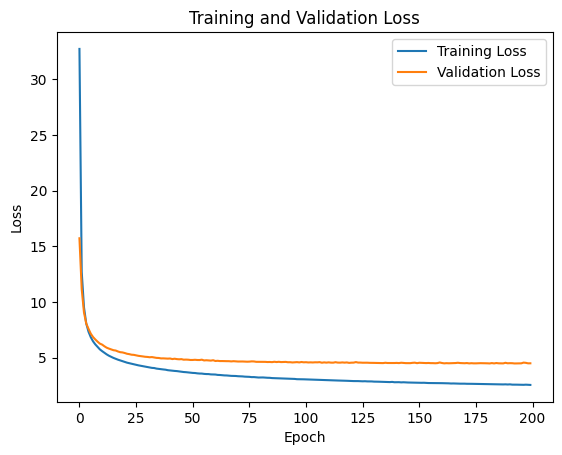

In [10]:
import matplotlib.pyplot as plt

# Plot training loss and validation loss
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.savefig('loss_plot_inception_v3.jpg', format='jpg',dpi=600)
plt.show()

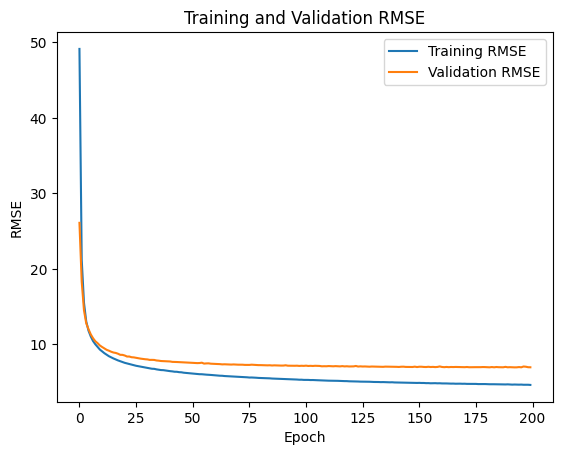

In [11]:
# Plot training RMSE and validation RMSE
plt.plot(history.history['rmse'], label='Training RMSE')
plt.plot(history.history['val_rmse'], label='Validation RMSE')
plt.title('Training and Validation RMSE')
plt.xlabel('Epoch')
plt.ylabel('RMSE')
plt.legend()
plt.savefig('rmse_plot_inception_v3.jpg', format='jpg',dpi=600)
plt.show()


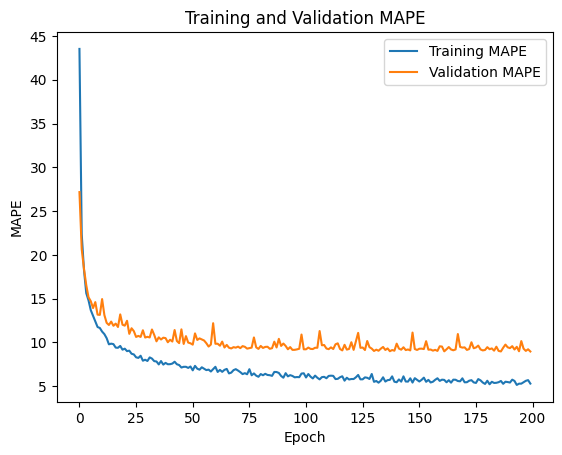

In [12]:
# Plot training MAPE and validation MAPE
plt.plot(history.history['mape'], label='Training MAPE')
plt.plot(history.history['val_mape'], label='Validation MAPE')
plt.title('Training and Validation MAPE')
plt.xlabel('Epoch')
plt.ylabel('MAPE')
plt.legend()
plt.savefig('mape_plot_inception_v3.jpg', format='jpg',dpi=600)
plt.show()

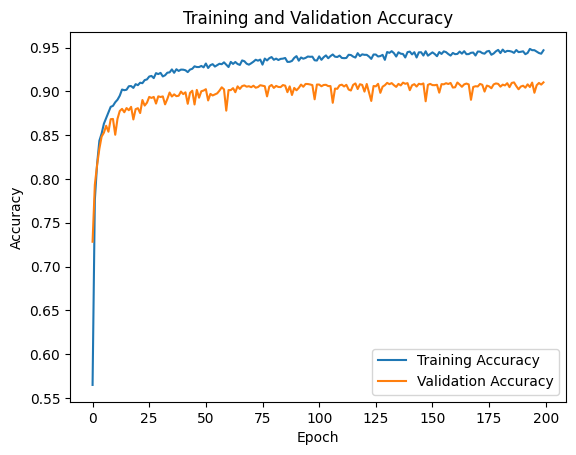

In [13]:
# Plot training Accuracy and validation Accuracy
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.savefig('accuracy_plot_inception_v3.jpg', format='jpg',dpi=600)
plt.show()

Sample 1:
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
  Original - Gender: Male, Height: 177.80 cm, Weight: 78.00 kg, BMR: 1781.25 calories
  Predicted - Gender: Male, Height: 167.16 cm, Weight: 74.79 kg, BMR: 1682.62 calories



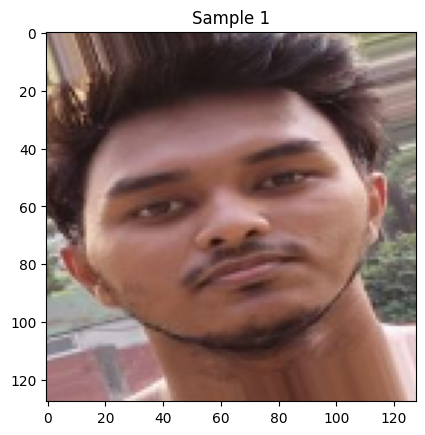

Sample 2:
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
  Original - Gender: Female, Height: 154.94 cm, Weight: 48.00 kg, BMR: 1172.38 calories
  Predicted - Gender: Female, Height: 162.05 cm, Weight: 59.43 kg, BMR: 1331.14 calories



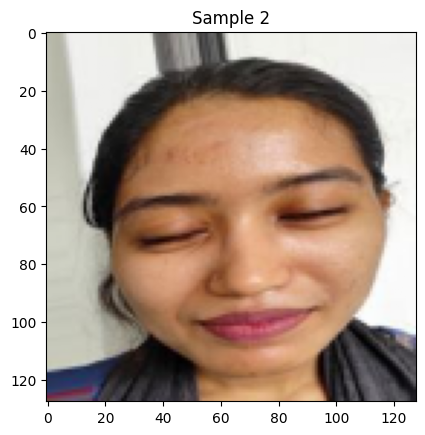

Sample 3:
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
  Original - Gender: Male, Height: 177.80 cm, Weight: 62.00 kg, BMR: 1621.25 calories
  Predicted - Gender: Female, Height: 169.45 cm, Weight: 61.67 kg, BMR: 1399.77 calories



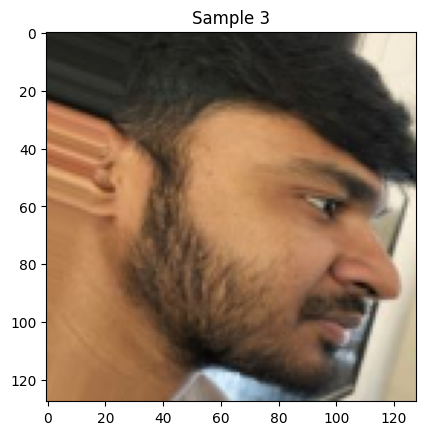

Sample 4:
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
  Original - Gender: Male, Height: 171.45 cm, Weight: 50.00 kg, BMR: 1461.56 calories
  Predicted - Gender: Male, Height: 160.27 cm, Weight: 40.87 kg, BMR: 1300.43 calories



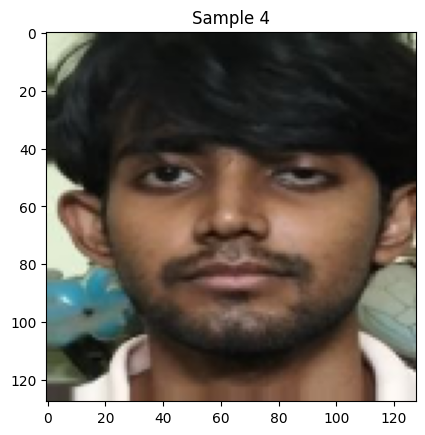

Sample 5:
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
  Original - Gender: Female, Height: 157.48 cm, Weight: 44.00 kg, BMR: 1148.25 calories
  Predicted - Gender: Female, Height: 169.78 cm, Weight: 53.62 kg, BMR: 1321.38 calories



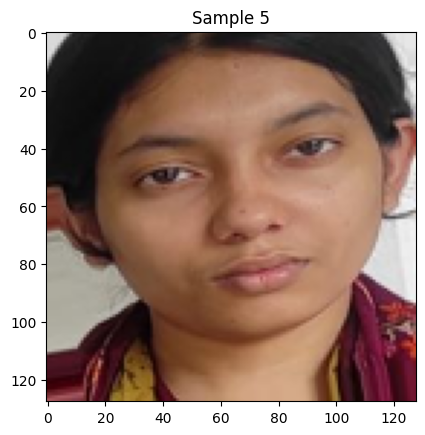

In [14]:
import numpy as np
import cv2
import pandas as pd
import os
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.layers import Flatten, Dense
from tensorflow.keras.models import Model
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt

# Define the calculate_bmr function
def calculate_bmr(gender_prob, weight, height, age):
    gender = 0 if gender_prob < 0.5 else 1
    if gender == 0:  # Assuming 0 represents Male
        bmr = 10 * weight + 6.25 * height - 5 * age + 5
    elif gender == 1:  # Assuming 1 represents Female
        bmr = 10 * weight + 6.25 * height - 5 * age - 161
    else:
        raise ValueError("Invalid gender value. Use 0 for Male, 1 for Female.")
    return bmr

# Lists to store original and predicted BMR, gender, height, and weight values
original_values_list = []
predicted_values_list = []

# Fixed age for calculation
age_for_calculation = 23

# Display original and predicted values for BMR, gender, height, and weight
for i in range(5):  # Adjust the number based on your preference
    print(f"Sample {i + 1}:")

    # Original values
    original_gender = "Male" if Y_test[i, 0] == 0 else "Female"
    original_height = Y_test[i, 1]
    original_weight = Y_test[i, 2]
    original_bmr = calculate_bmr(Y_test[i, 0], original_weight, original_height, age_for_calculation)

    original_values_list.append({
        'Gender': original_gender,
        'Height': original_height,
        'Weight': original_weight,
        'BMR': original_bmr
    })

    # Predicted values from your model
    predictions = model.predict(np.expand_dims(X_test[i], axis=0))
    predicted_gender_prob = predictions[0, 0]
    predicted_gender = "Male" if predicted_gender_prob < 0.5 else "Female"
    predicted_height = predictions[0, 1]
    predicted_weight = predictions[0, 2]

    # Calculate predicted BMR using predicted gender probability, height, weight, and fixed age
    predicted_bmr = calculate_bmr(predicted_gender_prob, predicted_weight, predicted_height, age_for_calculation)

    predicted_values_list.append({
        'Gender': predicted_gender,
        'Height': predicted_height,
        'Weight': predicted_weight,
        'BMR': predicted_bmr
    })

    # Display original and predicted values
    print(f"  Original - Gender: {original_gender}, Height: {original_height:.2f} cm, Weight: {original_weight:.2f} kg, BMR: {original_bmr:.2f} calories")
    print(f"  Predicted - Gender: {predicted_gender}, Height: {predicted_height:.2f} cm, Weight: {predicted_weight:.2f} kg, BMR: {predicted_bmr:.2f} calories")
    print()

    # Display the image
    plt.imshow(X_test[i])
    plt.title(f"Sample {i + 1}")
    plt.show()


MobileNet

In [23]:
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, Flatten, Dense, BatchNormalization, Dropout, ReLU
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import ReduceLROnPlateau, EarlyStopping
import tensorflow as tf
from tensorflow.keras.applications import MobileNet
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense, Flatten
from tensorflow.keras.optimizers import Adam

# Define the input shape
input_shape = (128, 128, 3)

# Load the MobileNet base model pretrained on ImageNet
mobilenet_base = MobileNet(weights='imagenet', include_top=False, input_shape=input_shape)
mobilenet_base.trainable = False

# Create a new model by adding a single dense layer for gender, height, and weight prediction
x = Flatten()(mobilenet_base.output)
combined_output = Dense(3, activation='linear', name='combined_out')(x)

# Create the final model
model = Model(inputs=mobilenet_base.input, outputs=combined_output)
# Define custom RMSE metric function
def rmse(y_true, y_pred):
    return tf.sqrt(tf.reduce_mean(tf.square(y_true - y_pred)))

#Define custom mean_absolute_percentage_error
def mape(y_true, y_pred):
    epsilon = 1e-0  # Small epsilon value to avoid division by zero
    y_true, y_pred = tf.squeeze(y_true), tf.squeeze(y_pred)
    return tf.reduce_mean(tf.abs((y_true - y_pred) / (y_true + epsilon))) * 100

def accuracy(y_true, y_pred):
    y_true = tf.cast(y_true, tf.double)
    y_pred = tf.cast(y_pred, tf.double)
    mape_score = mape(y_true, y_pred)
    accuracy = (100 - mape_score) / 100
    return accuracy





# Compile the model with Mean Absolute Error (MAE) as the loss function for all predictions
model.compile(
    optimizer=Adam(learning_rate=0.0002),  # Adam optimizer
    loss='mae',
    metrics=[mape, rmse, accuracy],
)

# Train the model and obtain history
history = model.fit(
    X_train,
    Y_train,
    epochs=200,
    batch_size=32,
    validation_data=(X_val, Y_val)
)


17225924/17225924 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
Epoch 1/200
197/197 ━━━━━━━━━━━━━━━━━━━━ 14s 46ms/step - accuracy: 0.4056 - loss: 42.2670 - mape: 59.4448 - rmse: 60.8204 - val_accuracy: 0.7473 - val_loss: 6.5089 - val_mape: 25.2651 - val_rmse: 10.1029
Epoch 2/200
197/197 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.7777 - loss: 5.9271 - mape: 22.2271 - rmse: 9.2844 - val_accuracy: 0.7774 - val_loss: 4.8411 - val_mape: 22.2647 - val_rmse: 7.4871
Epoch 3/200
197/197 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.8101 - loss: 4.5207 - mape: 18.9913 - rmse: 7.1722 - val_accuracy: 0.8073 - val_loss: 4.1589 - val_mape: 19.2675 - val_rmse: 6.4449
Epoch 4/200
197/197 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.8472 - loss: 3.8124 - mape: 15.2793 - rmse: 6.2049 - val_accuracy: 0.7862 - val_loss: 3.7735 - val_mape: 21.3755 - val_rmse: 5.7465
Epoch 5/200
197/197 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.8576 - loss: 3.2897 - mape: 14.2437 - rmse: 5.3118 - val_accuracy: 0.8132 - v

In [24]:
import numpy as np
import tensorflow as tf
from tensorflow.keras.losses import mean_absolute_error


# Evaluate the model on the test set
test = model.evaluate(X_test, Y_test, batch_size=32)

# Assuming gender, height, and weight are the first, second, and third columns in Y_test
y_pred = model.predict(X_test)

# Cast Y_test and y_pred to double tensors
Y_test = tf.cast(Y_test, tf.double)
y_pred = tf.cast(y_pred, tf.double)

# Compute Mean Absolute Error for gender, height, and weight
gender_test_mae = mean_absolute_error(Y_test[:, 0], y_pred[:, 0])
height_test_mae = mean_absolute_error(Y_test[:, 1], y_pred[:, 1])
weight_test_mae = mean_absolute_error(Y_test[:, 2], y_pred[:, 2])

print("Gender Test MAE:", gender_test_mae.numpy().item())
print("Height Test MAE:", height_test_mae.numpy().item())
print("Weight Test MAE:", weight_test_mae.numpy().item())

# Compute Mean Absolute Percentage Error (MAPE) for gender, height, and weight
gender_test_mape = mape(Y_test[:, 0], y_pred[:, 0])
height_test_mape = mape(Y_test[:, 1], y_pred[:, 1])
weight_test_mape = mape(Y_test[:, 2], y_pred[:, 2])

print("Gender Test MAPE:", gender_test_mape.numpy().item())
print("Height Test MAPE:", height_test_mape.numpy().item())
print("Weight Test MAPE:", weight_test_mape.numpy().item())

# Compute Root Mean Squared Error (RMSE) for gender, height, and weight
gender_test_rmse = rmse(Y_test[:, 0], y_pred[:, 0])
height_test_rmse = rmse(Y_test[:, 1], y_pred[:, 1])
weight_test_rmse = rmse(Y_test[:, 2], y_pred[:, 2])

print("Gender Test RMSE:", gender_test_rmse.numpy().item())
print("Height Test RMSE:", height_test_rmse.numpy().item())
print("Weight Test RMSE:", weight_test_rmse.numpy().item())


# Compute accuracy for gender, height, and weight 
gender_test_accuracy = accuracy(Y_test[:, 0], y_pred[:, 0])
height_test_accuracy = accuracy(Y_test[:, 1], y_pred[:, 1])
weight_test_accuracy = accuracy(Y_test[:, 2], y_pred[:, 2])

print("Gender Test Accuracy:", gender_test_accuracy.numpy().item())
print("Height Test Accuracy:", height_test_accuracy.numpy().item())
print("Weight Test Accuracy:", weight_test_accuracy.numpy().item())

43/43 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step - accuracy: 0.8518 - loss: 2.5501 - mape: 14.8192 - rmse: 3.8901
43/43 ━━━━━━━━━━━━━━━━━━━━ 3s 43ms/step
Gender Test MAE: 0.4499958095513284
Height Test MAE: 4.000334687409579
Weight Test MAE: 3.258541223031503
Gender Test MAPE: 37.15482839121035
Height Test MAPE: 2.3817202695065065
Weight Test MAPE: 5.152763663728307
Gender Test RMSE: 0.5880034277793695
Height Test RMSE: 5.256748505503812
Weight Test RMSE: 4.276260888022199
Gender Test Accuracy: 0.6284517160878965
Height Test Accuracy: 0.976182797304935
Weight Test Accuracy: 0.9484723633627169


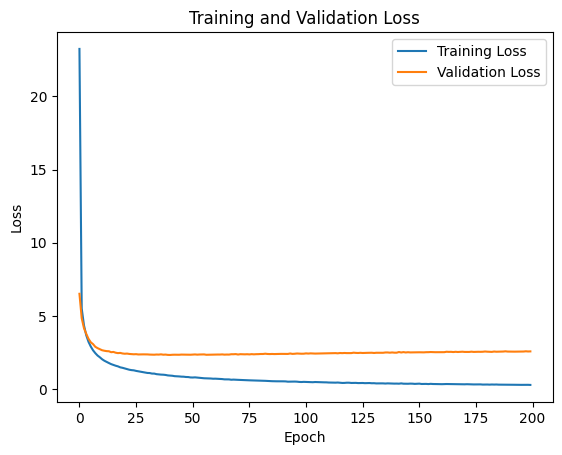

In [25]:
import matplotlib.pyplot as plt

# Plot training loss and validation loss
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.savefig('loss_plot_mobilenet.jpg', format='jpg',dpi=600)
plt.show()

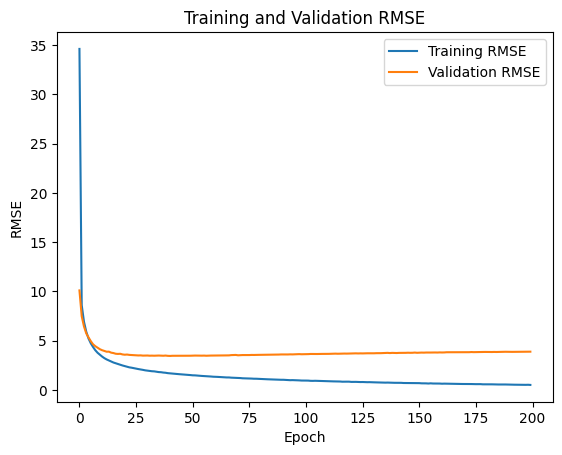

In [26]:
# Plot training RMSE and validation RMSE
plt.plot(history.history['rmse'], label='Training RMSE')
plt.plot(history.history['val_rmse'], label='Validation RMSE')
plt.title('Training and Validation RMSE')
plt.xlabel('Epoch')
plt.ylabel('RMSE')
plt.legend()
plt.savefig('rmse_plot_mobilenet.jpg', format='jpg',dpi=600)
plt.show()

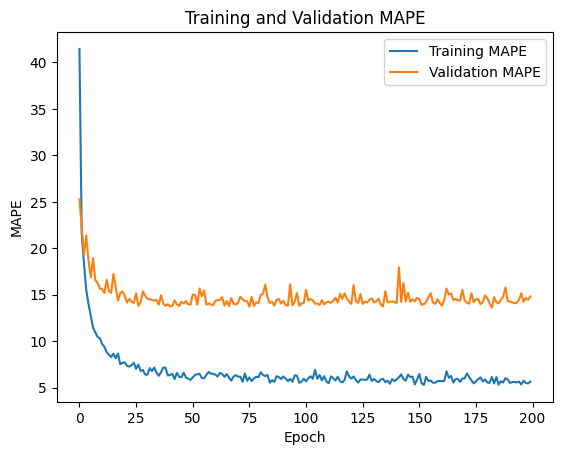

In [27]:
# Plot training MAPE and validation MAPE
plt.plot(history.history['mape'], label='Training MAPE')
plt.plot(history.history['val_mape'], label='Validation MAPE')
plt.title('Training and Validation MAPE')
plt.xlabel('Epoch')
plt.ylabel('MAPE')
plt.legend()
plt.savefig('mape_plot_mobilenet.jpg', format='jpg',dpi=600)
plt.show()


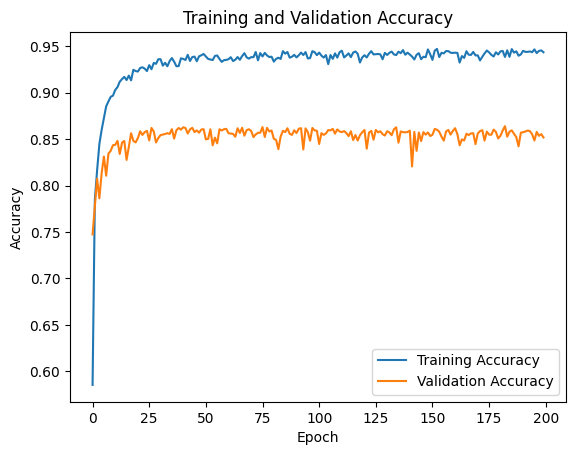

In [28]:
# Plot training Accuracy and validation Accuracy
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.savefig('accuracy_plot_mobilenet.jpg', format='jpg',dpi=600)
plt.show()


Sample 1:
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
  Original - Gender: Male, Height: 177.80 cm, Weight: 78.00 kg, BMR: 1781.25 calories
  Predicted - Gender: Male, Height: 190.46 cm, Weight: 89.75 kg, BMR: 1977.86 calories



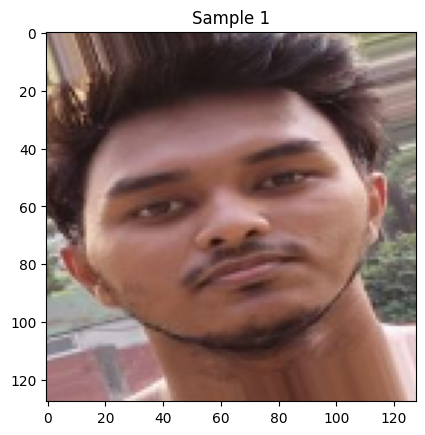

Sample 2:
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
  Original - Gender: Female, Height: 154.94 cm, Weight: 48.00 kg, BMR: 1172.38 calories
  Predicted - Gender: Female, Height: 159.78 cm, Weight: 50.83 kg, BMR: 1230.95 calories



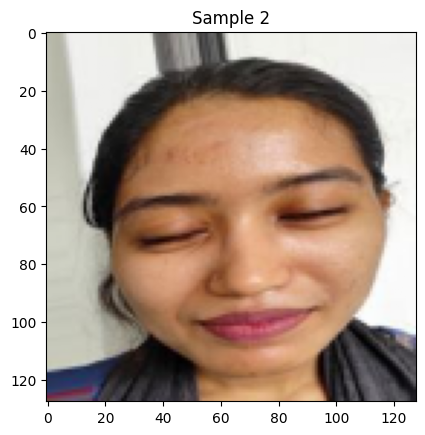

Sample 3:
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
  Original - Gender: Male, Height: 177.80 cm, Weight: 62.00 kg, BMR: 1621.25 calories
  Predicted - Gender: Male, Height: 148.02 cm, Weight: 52.08 kg, BMR: 1335.93 calories



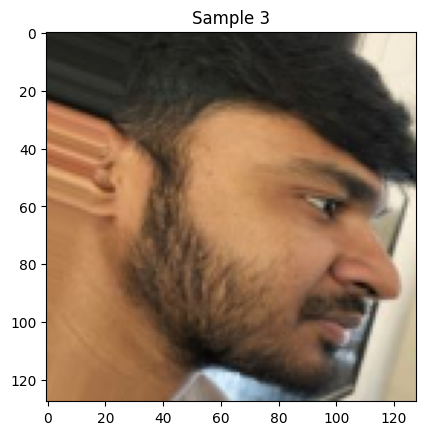

Sample 4:
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
  Original - Gender: Male, Height: 171.45 cm, Weight: 50.00 kg, BMR: 1461.56 calories
  Predicted - Gender: Male, Height: 173.43 cm, Weight: 41.94 kg, BMR: 1393.32 calories



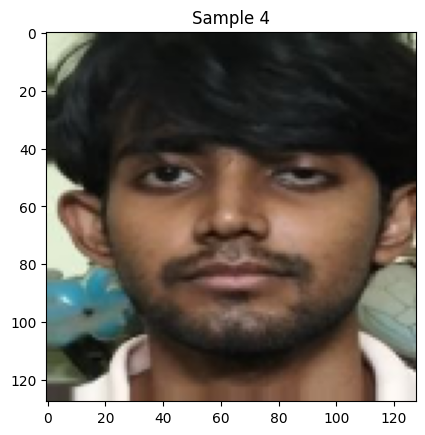

Sample 5:
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
  Original - Gender: Female, Height: 157.48 cm, Weight: 44.00 kg, BMR: 1148.25 calories
  Predicted - Gender: Female, Height: 160.20 cm, Weight: 46.40 kg, BMR: 1189.23 calories



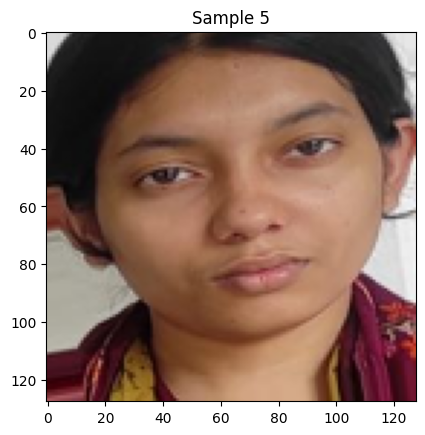

In [29]:
import numpy as np
import cv2
import pandas as pd
import os
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.layers import Flatten, Dense
from tensorflow.keras.models import Model
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt

# Define the calculate_bmr function
def calculate_bmr(gender_prob, weight, height, age):
    gender = 0 if gender_prob < 0.5 else 1
    if gender == 0:  # Assuming 0 represents Male
        bmr = 10 * weight + 6.25 * height - 5 * age + 5
    elif gender == 1:  # Assuming 1 represents Female
        bmr = 10 * weight + 6.25 * height - 5 * age - 161
    else:
        raise ValueError("Invalid gender value. Use 0 for Male, 1 for Female.")
    return bmr

# Lists to store original and predicted BMR, gender, height, and weight values
original_values_list = []
predicted_values_list = []

# Fixed age for calculation
age_for_calculation = 23

# Display original and predicted values for BMR, gender, height, and weight
for i in range(5):  # Adjust the number based on your preference
    print(f"Sample {i + 1}:")

    # Original values
    original_gender = "Male" if Y_test[i, 0] == 0 else "Female"
    original_height = Y_test[i, 1]
    original_weight = Y_test[i, 2]
    original_bmr = calculate_bmr(Y_test[i, 0], original_weight, original_height, age_for_calculation)

    original_values_list.append({
        'Gender': original_gender,
        'Height': original_height,
        'Weight': original_weight,
        'BMR': original_bmr
    })

    # Predicted values from your model
    predictions = model.predict(np.expand_dims(X_test[i], axis=0))
    predicted_gender_prob = predictions[0, 0]
    predicted_gender = "Male" if predicted_gender_prob < 0.5 else "Female"
    predicted_height = predictions[0, 1]
    predicted_weight = predictions[0, 2]

    # Calculate predicted BMR using predicted gender probability, height, weight, and fixed age
    predicted_bmr = calculate_bmr(predicted_gender_prob, predicted_weight, predicted_height, age_for_calculation)

    predicted_values_list.append({
        'Gender': predicted_gender,
        'Height': predicted_height,
        'Weight': predicted_weight,
        'BMR': predicted_bmr
    })

    # Display original and predicted values
    print(f"  Original - Gender: {original_gender}, Height: {original_height:.2f} cm, Weight: {original_weight:.2f} kg, BMR: {original_bmr:.2f} calories")
    print(f"  Predicted - Gender: {predicted_gender}, Height: {predicted_height:.2f} cm, Weight: {predicted_weight:.2f} kg, BMR: {predicted_bmr:.2f} calories")
    print()

    # Display the image
    plt.imshow(X_test[i])
    plt.title(f"Sample {i + 1}")
    plt.show()


DenseNet121

In [30]:
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, Flatten, Dense, BatchNormalization, Dropout, ReLU
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import ReduceLROnPlateau, EarlyStopping
import tensorflow as tf
from tensorflow.keras.applications import DenseNet121
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense, Flatten
from tensorflow.keras.optimizers import Adam

# Define the input shape
input_shape = (128, 128, 3)

# Load the DenseNet121 base model pretrained on ImageNet
densenet_base = DenseNet121(weights='imagenet', include_top=False, input_shape=input_shape)
densenet_base.trainable = False

# Create a new model by adding a single dense layer for gender, height, and weight prediction
x = Flatten()(densenet_base.output)
combined_output = Dense(3, activation='linear', name='combined_out')(x)

# Create the final model
model = Model(inputs=densenet_base.input, outputs=combined_output)
# Define custom RMSE metric function
def rmse(y_true, y_pred):
    return tf.sqrt(tf.reduce_mean(tf.square(y_true - y_pred)))

#Define custom mean_absolute_percentage_error
def mape(y_true, y_pred):
    epsilon = 1e-0  # Small epsilon value to avoid division by zero
    y_true, y_pred = tf.squeeze(y_true), tf.squeeze(y_pred)
    return tf.reduce_mean(tf.abs((y_true - y_pred) / (y_true + epsilon))) * 100

def accuracy(y_true, y_pred):
    y_true = tf.cast(y_true, tf.double)
    y_pred = tf.cast(y_pred, tf.double)
    mape_score = mape(y_true, y_pred)
    accuracy = (100 - mape_score) / 100
    return accuracy





# Compile the model with Mean Absolute Error (MAE) as the loss function for all predictions
model.compile(
    optimizer=Adam(learning_rate=0.0002),  # Adam optimizer
    loss='mae',
    metrics=[mape, rmse, accuracy],
)

# Train the model and obtain history
history = model.fit(
    X_train,
    Y_train,
    epochs=200,
    batch_size=32,
    validation_data=(X_val, Y_val)
)

29084464/29084464 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
Epoch 1/200
197/197 ━━━━━━━━━━━━━━━━━━━━ 64s 194ms/step - accuracy: 0.4240 - loss: 44.0533 - mape: 57.6032 - rmse: 63.5433 - val_accuracy: 0.7852 - val_loss: 8.5990 - val_mape: 21.4848 - val_rmse: 13.5393
Epoch 2/200
197/197 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step - accuracy: 0.8093 - loss: 7.3120 - mape: 19.0662 - rmse: 11.4396 - val_accuracy: 0.8443 - val_loss: 5.8111 - val_mape: 15.5708 - val_rmse: 9.2475
Epoch 3/200
197/197 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step - accuracy: 0.8459 - loss: 5.4016 - mape: 15.4078 - rmse: 8.5526 - val_accuracy: 0.8483 - val_loss: 4.8312 - val_mape: 15.1660 - val_rmse: 7.5727
Epoch 4/200
197/197 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step - accuracy: 0.8742 - loss: 4.5086 - mape: 12.5821 - rmse: 7.1795 - val_accuracy: 0.8674 - val_loss: 4.3619 - val_mape: 13.2650 - val_rmse: 6.7920
Epoch 5/200
197/197 ━━━━━━━━━━━━━━━━━━━━ 6s 31ms/step - accuracy: 0.8817 - loss: 3.9645 - mape: 11.8304 - rmse: 6.3025 - val_accuracy: 0.8831 -

In [31]:
import numpy as np
import tensorflow as tf
from tensorflow.keras.losses import mean_absolute_error


# Evaluate the model on the test set
test = model.evaluate(X_test, Y_test, batch_size=32)

# Assuming gender, height, and weight are the first, second, and third columns in Y_test
y_pred = model.predict(X_test)

# Cast Y_test and y_pred to double tensors
Y_test = tf.cast(Y_test, tf.double)
y_pred = tf.cast(y_pred, tf.double)

# Compute Mean Absolute Error for gender, height, and weight
gender_test_mae = mean_absolute_error(Y_test[:, 0], y_pred[:, 0])
height_test_mae = mean_absolute_error(Y_test[:, 1], y_pred[:, 1])
weight_test_mae = mean_absolute_error(Y_test[:, 2], y_pred[:, 2])

print("Gender Test MAE:", gender_test_mae.numpy().item())
print("Height Test MAE:", height_test_mae.numpy().item())
print("Weight Test MAE:", weight_test_mae.numpy().item())

# Compute Mean Absolute Percentage Error (MAPE) for gender, height, and weight
gender_test_mape = mape(Y_test[:, 0], y_pred[:, 0])
height_test_mape = mape(Y_test[:, 1], y_pred[:, 1])
weight_test_mape = mape(Y_test[:, 2], y_pred[:, 2])

print("Gender Test MAPE:", gender_test_mape.numpy().item())
print("Height Test MAPE:", height_test_mape.numpy().item())
print("Weight Test MAPE:", weight_test_mape.numpy().item())

# Compute Root Mean Squared Error (RMSE) for gender, height, and weight
gender_test_rmse = rmse(Y_test[:, 0], y_pred[:, 0])
height_test_rmse = rmse(Y_test[:, 1], y_pred[:, 1])
weight_test_rmse = rmse(Y_test[:, 2], y_pred[:, 2])

print("Gender Test RMSE:", gender_test_rmse.numpy().item())
print("Height Test RMSE:", height_test_rmse.numpy().item())
print("Weight Test RMSE:", weight_test_rmse.numpy().item())


# Compute accuracy for gender, height, and weight 
gender_test_accuracy = accuracy(Y_test[:, 0], y_pred[:, 0])
height_test_accuracy = accuracy(Y_test[:, 1], y_pred[:, 1])
weight_test_accuracy = accuracy(Y_test[:, 2], y_pred[:, 2])

print("Gender Test Accuracy:", gender_test_accuracy.numpy().item())
print("Height Test Accuracy:", height_test_accuracy.numpy().item())
print("Weight Test Accuracy:", weight_test_accuracy.numpy().item())

43/43 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - accuracy: 0.9045 - loss: 2.2441 - mape: 9.5510 - rmse: 3.4097
43/43 ━━━━━━━━━━━━━━━━━━━━ 19s 237ms/step
Gender Test MAE: 0.24372230243179258
Height Test MAE: 2.937344440827547
Weight Test MAE: 3.460447640595613
Gender Test MAPE: 20.359320080356188
Height Test MAPE: 1.7520754547482549
Weight Test MAPE: 5.441004752713484
Gender Test RMSE: 0.2977109473832361
Height Test RMSE: 3.7892311764848725
Weight Test RMSE: 4.614301603637215
Gender Test Accuracy: 0.7964067991964382
Height Test Accuracy: 0.9824792454525175
Weight Test Accuracy: 0.9455899524728651


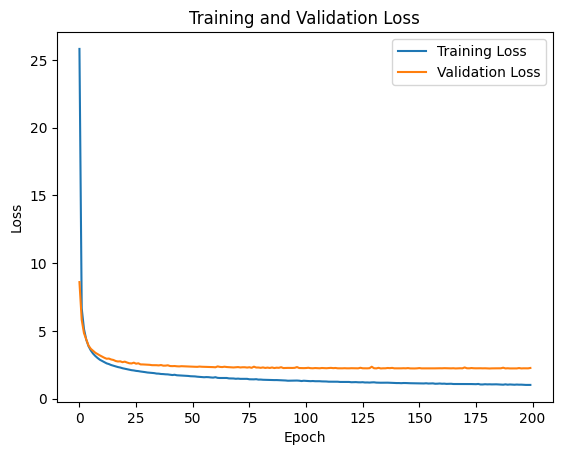

In [32]:
import matplotlib.pyplot as plt

# Plot training loss and validation loss
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.savefig('loss_plot_densenet121.jpg', format='jpg',dpi=600)
plt.show()


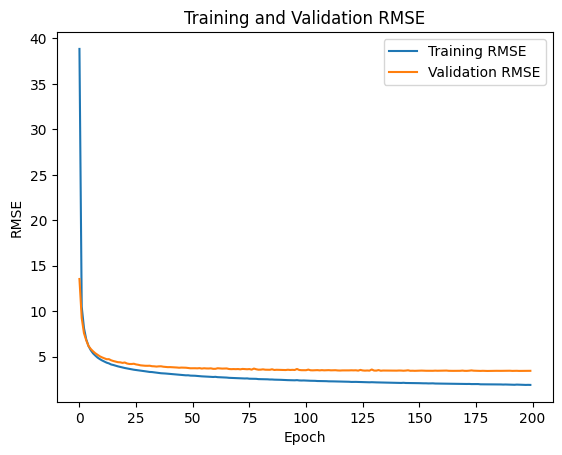

In [33]:
# Plot training RMSE and validation RMSE
plt.plot(history.history['rmse'], label='Training RMSE')
plt.plot(history.history['val_rmse'], label='Validation RMSE')
plt.title('Training and Validation RMSE')
plt.xlabel('Epoch')
plt.ylabel('RMSE')
plt.legend()
plt.savefig('rmse_plot_densenet121.jpg', format='jpg',dpi=600)
plt.show()

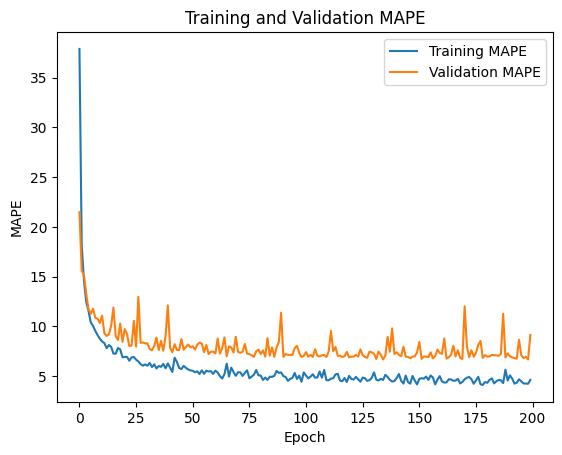

In [34]:
# Plot training MAPE and validation MAPE
plt.plot(history.history['mape'], label='Training MAPE')
plt.plot(history.history['val_mape'], label='Validation MAPE')
plt.title('Training and Validation MAPE')
plt.xlabel('Epoch')
plt.ylabel('MAPE')
plt.legend()
plt.savefig('mape_plot_densenet121.jpg', format='jpg',dpi=600)
plt.show()


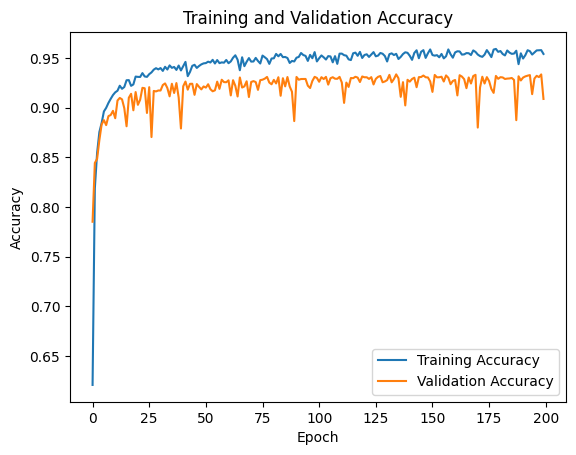

In [35]:
# Plot training Accuracy and validation Accuracy
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.savefig('accuracy_plot_densenet121.jpg', format='jpg',dpi=600)
plt.show()

Sample 1:
1/1 ━━━━━━━━━━━━━━━━━━━━ 8s 8s/step
  Original - Gender: Male, Height: 177.80 cm, Weight: 78.00 kg, BMR: 1781.25 calories
  Predicted - Gender: Male, Height: 178.15 cm, Weight: 77.07 kg, BMR: 1774.16 calories



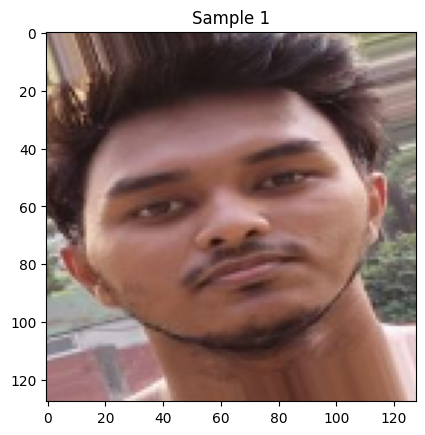

Sample 2:
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
  Original - Gender: Female, Height: 154.94 cm, Weight: 48.00 kg, BMR: 1172.38 calories
  Predicted - Gender: Female, Height: 159.75 cm, Weight: 49.19 kg, BMR: 1214.36 calories



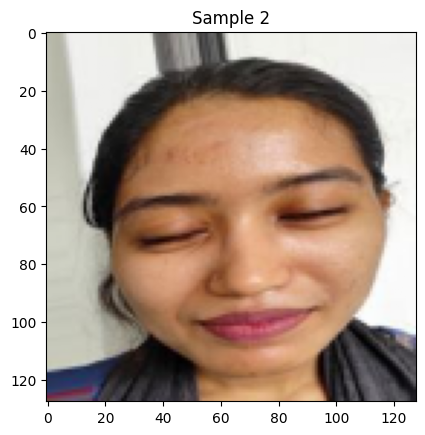

Sample 3:
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
  Original - Gender: Male, Height: 177.80 cm, Weight: 62.00 kg, BMR: 1621.25 calories
  Predicted - Gender: Male, Height: 172.89 cm, Weight: 67.28 kg, BMR: 1643.40 calories



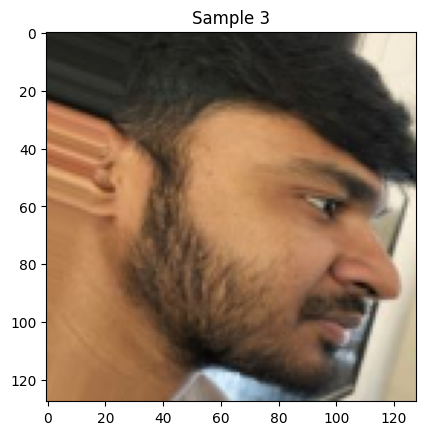

Sample 4:
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
  Original - Gender: Male, Height: 171.45 cm, Weight: 50.00 kg, BMR: 1461.56 calories
  Predicted - Gender: Male, Height: 176.03 cm, Weight: 53.59 kg, BMR: 1526.11 calories



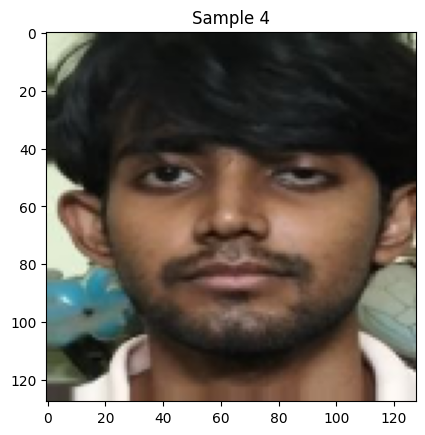

Sample 5:
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
  Original - Gender: Female, Height: 157.48 cm, Weight: 44.00 kg, BMR: 1148.25 calories
  Predicted - Gender: Female, Height: 151.21 cm, Weight: 41.00 kg, BMR: 1079.00 calories



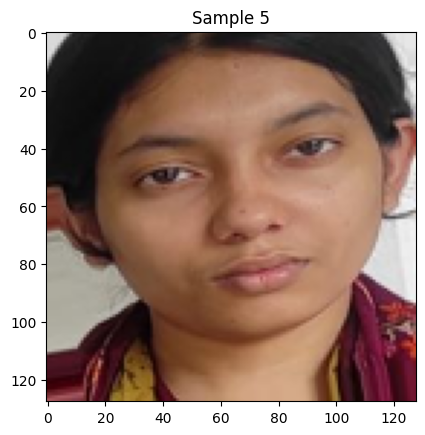

In [36]:
import numpy as np
import cv2
import pandas as pd
import os
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.layers import Flatten, Dense
from tensorflow.keras.models import Model
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt

# Define the calculate_bmr function
def calculate_bmr(gender_prob, weight, height, age):
    gender = 0 if gender_prob < 0.5 else 1
    if gender == 0:  # Assuming 0 represents Male
        bmr = 10 * weight + 6.25 * height - 5 * age + 5
    elif gender == 1:  # Assuming 1 represents Female
        bmr = 10 * weight + 6.25 * height - 5 * age - 161
    else:
        raise ValueError("Invalid gender value. Use 0 for Male, 1 for Female.")
    return bmr

# Lists to store original and predicted BMR, gender, height, and weight values
original_values_list = []
predicted_values_list = []

# Fixed age for calculation
age_for_calculation = 23

# Display original and predicted values for BMR, gender, height, and weight
for i in range(5):  # Adjust the number based on your preference
    print(f"Sample {i + 1}:")

    # Original values
    original_gender = "Male" if Y_test[i, 0] == 0 else "Female"
    original_height = Y_test[i, 1]
    original_weight = Y_test[i, 2]
    original_bmr = calculate_bmr(Y_test[i, 0], original_weight, original_height, age_for_calculation)

    original_values_list.append({
        'Gender': original_gender,
        'Height': original_height,
        'Weight': original_weight,
        'BMR': original_bmr
    })

    # Predicted values from your model
    predictions = model.predict(np.expand_dims(X_test[i], axis=0))
    predicted_gender_prob = predictions[0, 0]
    predicted_gender = "Male" if predicted_gender_prob < 0.5 else "Female"
    predicted_height = predictions[0, 1]
    predicted_weight = predictions[0, 2]

    # Calculate predicted BMR using predicted gender probability, height, weight, and fixed age
    predicted_bmr = calculate_bmr(predicted_gender_prob, predicted_weight, predicted_height, age_for_calculation)

    predicted_values_list.append({
        'Gender': predicted_gender,
        'Height': predicted_height,
        'Weight': predicted_weight,
        'BMR': predicted_bmr
    })

    # Display original and predicted values
    print(f"  Original - Gender: {original_gender}, Height: {original_height:.2f} cm, Weight: {original_weight:.2f} kg, BMR: {original_bmr:.2f} calories")
    print(f"  Predicted - Gender: {predicted_gender}, Height: {predicted_height:.2f} cm, Weight: {predicted_weight:.2f} kg, BMR: {predicted_bmr:.2f} calories")
    print()

    # Display the image
    plt.imshow(X_test[i])
    plt.title(f"Sample {i + 1}")
    plt.show()


MobileNet V2

In [37]:
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, Flatten, Dense, BatchNormalization, Dropout, ReLU
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import ReduceLROnPlateau, EarlyStopping
import tensorflow as tf
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.layers import Flatten, Dense
from tensorflow.keras.models import Model

# Define the input shape
input_shape = (128, 128, 3)

# Load the MobileNetV2 base model pretrained on ImageNet
mobilenetv2_base = MobileNetV2(weights='imagenet', include_top=False, input_shape=input_shape)
mobilenetv2_base.trainable = False

# Create a new model by adding a single dense layer for gender, height, and weight prediction
x = Flatten()(mobilenetv2_base.output)
combined_output = Dense(3, activation='linear', name='combined_out')(x)

# Create the combined model
combined_model = Model(inputs=mobilenetv2_base.input, outputs=combined_output)

# Define custom RMSE metric function
def rmse(y_true, y_pred):
    return tf.sqrt(tf.reduce_mean(tf.square(y_true - y_pred)))

#Define custom mean_absolute_percentage_error
def mape(y_true, y_pred):
    epsilon = 1e-0  # Small epsilon value to avoid division by zero
    y_true, y_pred = tf.squeeze(y_true), tf.squeeze(y_pred)
    return tf.reduce_mean(tf.abs((y_true - y_pred) / (y_true + epsilon))) * 100

def accuracy(y_true, y_pred):
    y_true = tf.cast(y_true, tf.double)
    y_pred = tf.cast(y_pred, tf.double)
    mape_score = mape(y_true, y_pred)
    accuracy = (100 - mape_score) / 100
    return accuracy





# Compile the model with Mean Absolute Error (MAE) as the loss function for all predictions
model.compile(
    optimizer=Adam(learning_rate=0.0002),  # Adam optimizer
    loss='mae',
    metrics=[mape, rmse, accuracy],
)

# Train the model and obtain history
history = model.fit(
    X_train,
    Y_train,
    epochs=200,
    batch_size=32,
    validation_data=(X_val, Y_val)
)


9406464/9406464 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
Epoch 1/200
197/197 ━━━━━━━━━━━━━━━━━━━━ 43s 126ms/step - accuracy: 0.9292 - loss: 1.0468 - mape: 7.0789 - rmse: 1.8939 - val_accuracy: 0.9309 - val_loss: 2.2299 - val_mape: 6.9124 - val_rmse: 3.4243
Epoch 2/200
197/197 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - accuracy: 0.9573 - loss: 0.9905 - mape: 4.2686 - rmse: 1.8629 - val_accuracy: 0.9237 - val_loss: 2.2356 - val_mape: 7.6263 - val_rmse: 3.4275
Epoch 3/200
197/197 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - accuracy: 0.9521 - loss: 0.9872 - mape: 4.7933 - rmse: 1.8512 - val_accuracy: 0.9086 - val_loss: 2.2542 - val_mape: 9.1405 - val_rmse: 3.4353
Epoch 4/200
197/197 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step - accuracy: 0.9507 - loss: 1.0003 - mape: 4.9310 - rmse: 1.8678 - val_accuracy: 0.9297 - val_loss: 2.2203 - val_mape: 7.0284 - val_rmse: 3.4159
Epoch 5/200
197/197 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - accuracy: 0.9541 - loss: 0.9871 - mape: 4.5925 - rmse: 1.8761 - val_accuracy: 0.9292 - val_loss: 2.23

In [38]:
import numpy as np
import tensorflow as tf
from tensorflow.keras.losses import mean_absolute_error


# Evaluate the model on the test set
test = model.evaluate(X_test, Y_test, batch_size=32)

# Assuming gender, height, and weight are the first, second, and third columns in Y_test
y_pred = model.predict(X_test)

# Cast Y_test and y_pred to double tensors
Y_test = tf.cast(Y_test, tf.double)
y_pred = tf.cast(y_pred, tf.double)

# Compute Mean Absolute Error for gender, height, and weight
gender_test_mae = mean_absolute_error(Y_test[:, 0], y_pred[:, 0])
height_test_mae = mean_absolute_error(Y_test[:, 1], y_pred[:, 1])
weight_test_mae = mean_absolute_error(Y_test[:, 2], y_pred[:, 2])

print("Gender Test MAE:", gender_test_mae.numpy().item())
print("Height Test MAE:", height_test_mae.numpy().item())
print("Weight Test MAE:", weight_test_mae.numpy().item())

# Compute Mean Absolute Percentage Error (MAPE) for gender, height, and weight
gender_test_mape = mape(Y_test[:, 0], y_pred[:, 0])
height_test_mape = mape(Y_test[:, 1], y_pred[:, 1])
weight_test_mape = mape(Y_test[:, 2], y_pred[:, 2])

print("Gender Test MAPE:", gender_test_mape.numpy().item())
print("Height Test MAPE:", height_test_mape.numpy().item())
print("Weight Test MAPE:", weight_test_mape.numpy().item())

# Compute Root Mean Squared Error (RMSE) for gender, height, and weight
gender_test_rmse = rmse(Y_test[:, 0], y_pred[:, 0])
height_test_rmse = rmse(Y_test[:, 1], y_pred[:, 1])
weight_test_rmse = rmse(Y_test[:, 2], y_pred[:, 2])

print("Gender Test RMSE:", gender_test_rmse.numpy().item())
print("Height Test RMSE:", height_test_rmse.numpy().item())
print("Weight Test RMSE:", weight_test_rmse.numpy().item())


# Compute accuracy for gender, height, and weight 
gender_test_accuracy = accuracy(Y_test[:, 0], y_pred[:, 0])
height_test_accuracy = accuracy(Y_test[:, 1], y_pred[:, 1])
weight_test_accuracy = accuracy(Y_test[:, 2], y_pred[:, 2])

print("Gender Test Accuracy:", gender_test_accuracy.numpy().item())
print("Height Test Accuracy:", height_test_accuracy.numpy().item())
print("Weight Test Accuracy:", weight_test_accuracy.numpy().item())

43/43 ━━━━━━━━━━━━━━━━━━━━ 1s 25ms/step - accuracy: 0.9232 - loss: 2.2479 - mape: 7.6824 - rmse: 3.4026
43/43 ━━━━━━━━━━━━━━━━━━━━ 18s 208ms/step
Gender Test MAE: 0.19276584991650586
Height Test MAE: 2.9984824530707463
Weight Test MAE: 3.5047015903614187
Gender Test MAPE: 15.93743936319111
Height Test MAPE: 1.7908762858458722
Weight Test MAPE: 5.564222152149358
Gender Test RMSE: 0.24501220922324238
Height Test RMSE: 3.838656477283725
Weight Test RMSE: 4.595805301158395
Gender Test Accuracy: 0.8406256063680888
Height Test Accuracy: 0.9820912371415413
Weight Test Accuracy: 0.9443577784785064


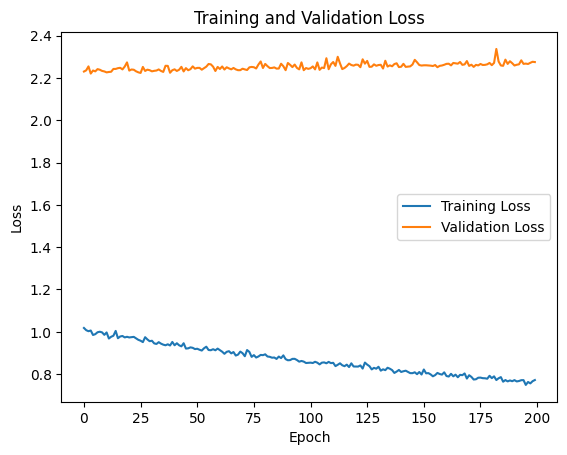

In [39]:
import matplotlib.pyplot as plt

# Plot training loss and validation loss
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.savefig('loss_plot_mobilenetv2.jpg', format='jpg',dpi=600)
plt.show()

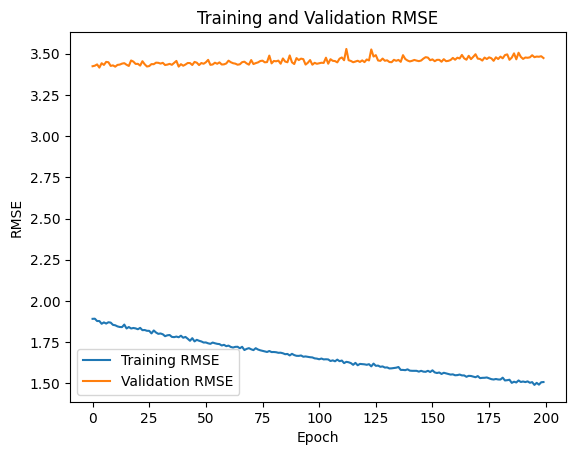

In [40]:
# Plot training RMSE and validation RMSE
plt.plot(history.history['rmse'], label='Training RMSE')
plt.plot(history.history['val_rmse'], label='Validation RMSE')
plt.title('Training and Validation RMSE')
plt.xlabel('Epoch')
plt.ylabel('RMSE')
plt.legend()
plt.savefig('rmse_plot_mobilenetv2.jpg', format='jpg',dpi=600)
plt.show()


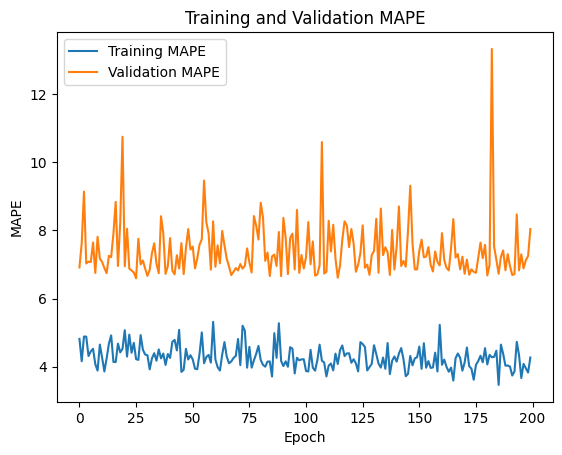

In [41]:
# Plot training MAPE and validation MAPE
plt.plot(history.history['mape'], label='Training MAPE')
plt.plot(history.history['val_mape'], label='Validation MAPE')
plt.title('Training and Validation MAPE')
plt.xlabel('Epoch')
plt.ylabel('MAPE')
plt.legend()
plt.savefig('mape_plot_mobilenetv2.jpg', format='jpg',dpi=600)
plt.show()

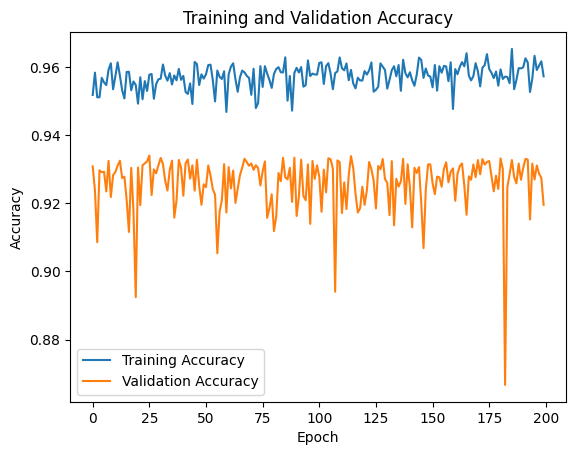

In [42]:
# Plot training Accuracy and validation Accuracy
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.savefig('accuracy_plot_mobilenetv2.jpg', format='jpg',dpi=600)
plt.show()

Sample 1:
1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step
  Original - Gender: Male, Height: 177.80 cm, Weight: 78.00 kg, BMR: 1781.25 calories
  Predicted - Gender: Male, Height: 179.59 cm, Weight: 79.70 kg, BMR: 1809.47 calories



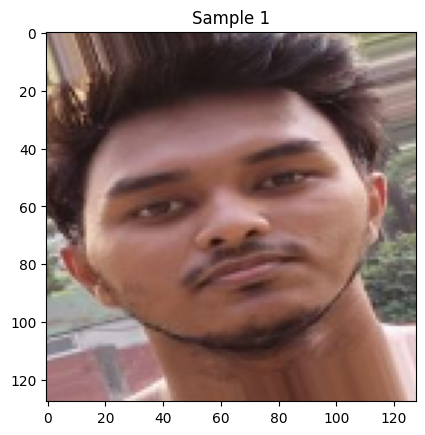

Sample 2:
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
  Original - Gender: Female, Height: 154.94 cm, Weight: 48.00 kg, BMR: 1172.38 calories
  Predicted - Gender: Female, Height: 160.49 cm, Weight: 49.40 kg, BMR: 1221.04 calories



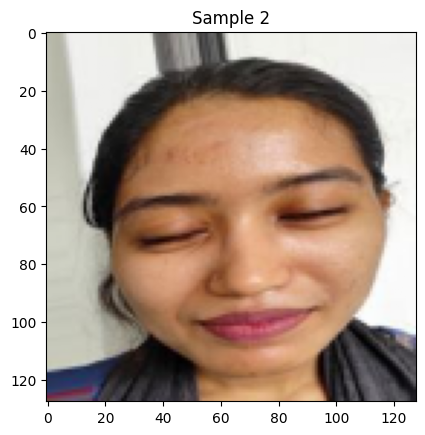

Sample 3:
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
  Original - Gender: Male, Height: 177.80 cm, Weight: 62.00 kg, BMR: 1621.25 calories
  Predicted - Gender: Male, Height: 171.92 cm, Weight: 67.69 kg, BMR: 1641.39 calories



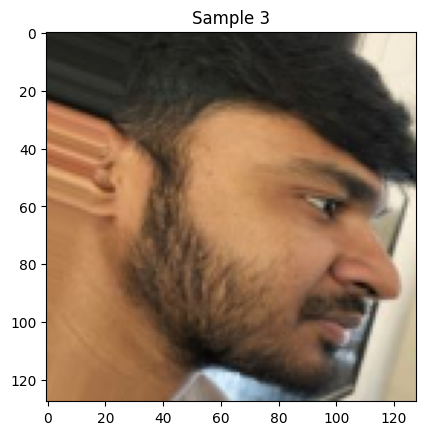

Sample 4:
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
  Original - Gender: Male, Height: 171.45 cm, Weight: 50.00 kg, BMR: 1461.56 calories
  Predicted - Gender: Male, Height: 175.11 cm, Weight: 51.01 kg, BMR: 1494.54 calories



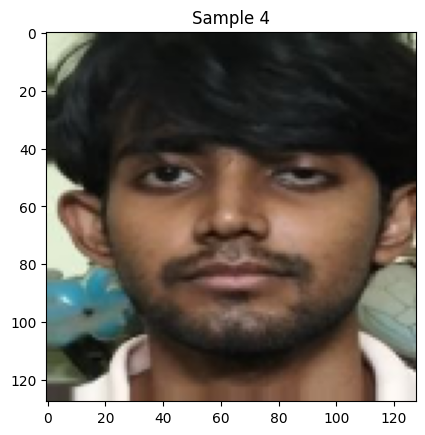

Sample 5:
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
  Original - Gender: Female, Height: 157.48 cm, Weight: 44.00 kg, BMR: 1148.25 calories
  Predicted - Gender: Female, Height: 150.84 cm, Weight: 40.58 kg, BMR: 1072.51 calories



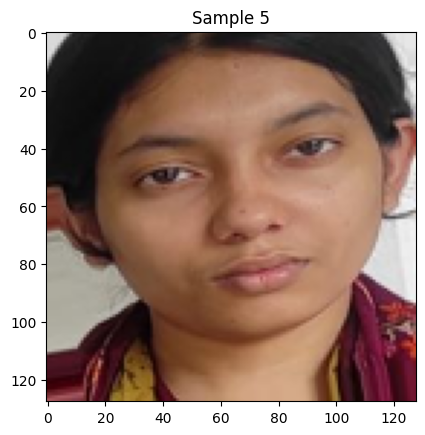

In [43]:
import numpy as np
import cv2
import pandas as pd
import os
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.layers import Flatten, Dense
from tensorflow.keras.models import Model
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt

# Define the calculate_bmr function
def calculate_bmr(gender_prob, weight, height, age):
    gender = 0 if gender_prob < 0.5 else 1
    if gender == 0:  # Assuming 0 represents Male
        bmr = 10 * weight + 6.25 * height - 5 * age + 5
    elif gender == 1:  # Assuming 1 represents Female
        bmr = 10 * weight + 6.25 * height - 5 * age - 161
    else:
        raise ValueError("Invalid gender value. Use 0 for Male, 1 for Female.")
    return bmr

# Lists to store original and predicted BMR, gender, height, and weight values
original_values_list = []
predicted_values_list = []

# Fixed age for calculation
age_for_calculation = 23

# Display original and predicted values for BMR, gender, height, and weight
for i in range(5):  # Adjust the number based on your preference
    print(f"Sample {i + 1}:")

    # Original values
    original_gender = "Male" if Y_test[i, 0] == 0 else "Female"
    original_height = Y_test[i, 1]
    original_weight = Y_test[i, 2]
    original_bmr = calculate_bmr(Y_test[i, 0], original_weight, original_height, age_for_calculation)

    original_values_list.append({
        'Gender': original_gender,
        'Height': original_height,
        'Weight': original_weight,
        'BMR': original_bmr
    })

    # Predicted values from your model
    predictions = model.predict(np.expand_dims(X_test[i], axis=0))
    predicted_gender_prob = predictions[0, 0]
    predicted_gender = "Male" if predicted_gender_prob < 0.5 else "Female"
    predicted_height = predictions[0, 1]
    predicted_weight = predictions[0, 2]

    # Calculate predicted BMR using predicted gender probability, height, weight, and fixed age
    predicted_bmr = calculate_bmr(predicted_gender_prob, predicted_weight, predicted_height, age_for_calculation)

    predicted_values_list.append({
        'Gender': predicted_gender,
        'Height': predicted_height,
        'Weight': predicted_weight,
        'BMR': predicted_bmr
    })

    # Display original and predicted values
    print(f"  Original - Gender: {original_gender}, Height: {original_height:.2f} cm, Weight: {original_weight:.2f} kg, BMR: {original_bmr:.2f} calories")
    print(f"  Predicted - Gender: {predicted_gender}, Height: {predicted_height:.2f} cm, Weight: {predicted_weight:.2f} kg, BMR: {predicted_bmr:.2f} calories")
    print()

    # Display the image
    plt.imshow(X_test[i])
    plt.title(f"Sample {i + 1}")
    plt.show()

ResNet50 V2

In [44]:
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, Flatten, Dense, BatchNormalization, Dropout, ReLU
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import ReduceLROnPlateau, EarlyStopping
import tensorflow as tf
from tensorflow.keras.applications import ResNet50V2
from tensorflow.keras.layers import Flatten, Dense
from tensorflow.keras.models import Model

# Define the input shape
input_shape = (128, 128, 3)

# Load the ResNet50V2 base model pretrained on ImageNet
resnet50v2_base = ResNet50V2(weights='imagenet', include_top=False, input_shape=input_shape)
resnet50v2_base.trainable = False

# Create a new model by adding a single dense layer for gender, height, and weight prediction
x = Flatten()(resnet50v2_base.output)
combined_output = Dense(3, activation='linear', name='combined_out')(x)

# Create the combined model
combined_model = Model(inputs=resnet50v2_base.input, outputs=combined_output)
# Define custom RMSE metric function
def rmse(y_true, y_pred):
    return tf.sqrt(tf.reduce_mean(tf.square(y_true - y_pred)))

#Define custom mean_absolute_percentage_error
def mape(y_true, y_pred):
    epsilon = 1e-0  # Small epsilon value to avoid division by zero
    y_true, y_pred = tf.squeeze(y_true), tf.squeeze(y_pred)
    return tf.reduce_mean(tf.abs((y_true - y_pred) / (y_true + epsilon))) * 100

def accuracy(y_true, y_pred):
    y_true = tf.cast(y_true, tf.double)
    y_pred = tf.cast(y_pred, tf.double)
    mape_score = mape(y_true, y_pred)
    accuracy = (100 - mape_score) / 100
    return accuracy





# Compile the model with Mean Absolute Error (MAE) as the loss function for all predictions
model.compile(
    optimizer=Adam(learning_rate=0.0002),  # Adam optimizer
    loss='mae',
    metrics=[mape, rmse, accuracy],
)

# Train the model and obtain history
history = model.fit(
    X_train,
    Y_train,
    epochs=200,
    batch_size=32,
    validation_data=(X_val, Y_val)
)


94668760/94668760 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
Epoch 1/200
197/197 ━━━━━━━━━━━━━━━━━━━━ 44s 126ms/step - accuracy: 0.9192 - loss: 0.8345 - mape: 8.0758 - rmse: 1.5460 - val_accuracy: 0.9311 - val_loss: 2.2661 - val_mape: 6.8935 - val_rmse: 3.4767
Epoch 2/200
197/197 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step - accuracy: 0.9574 - loss: 0.7596 - mape: 4.2611 - rmse: 1.4912 - val_accuracy: 0.9316 - val_loss: 2.2654 - val_mape: 6.8419 - val_rmse: 3.4851
Epoch 3/200
197/197 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step - accuracy: 0.9630 - loss: 0.7474 - mape: 3.7030 - rmse: 1.4921 - val_accuracy: 0.9251 - val_loss: 2.2809 - val_mape: 7.4874 - val_rmse: 3.4931
Epoch 4/200
197/197 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - accuracy: 0.9563 - loss: 0.7549 - mape: 4.3701 - rmse: 1.4912 - val_accuracy: 0.9291 - val_loss: 2.2709 - val_mape: 7.0938 - val_rmse: 3.4914
Epoch 5/200
197/197 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step - accuracy: 0.9578 - loss: 0.7476 - mape: 4.2158 - rmse: 1.4742 - val_accuracy: 0.9274 - val_loss: 2.

In [45]:
import numpy as np
import tensorflow as tf
from tensorflow.keras.losses import mean_absolute_error


# Evaluate the model on the test set
test = model.evaluate(X_test, Y_test, batch_size=32)

# Assuming gender, height, and weight are the first, second, and third columns in Y_test
y_pred = model.predict(X_test)

# Cast Y_test and y_pred to double tensors
Y_test = tf.cast(Y_test, tf.double)
y_pred = tf.cast(y_pred, tf.double)

# Compute Mean Absolute Error for gender, height, and weight
gender_test_mae = mean_absolute_error(Y_test[:, 0], y_pred[:, 0])
height_test_mae = mean_absolute_error(Y_test[:, 1], y_pred[:, 1])
weight_test_mae = mean_absolute_error(Y_test[:, 2], y_pred[:, 2])

print("Gender Test MAE:", gender_test_mae.numpy().item())
print("Height Test MAE:", height_test_mae.numpy().item())
print("Weight Test MAE:", weight_test_mae.numpy().item())

# Compute Mean Absolute Percentage Error (MAPE) for gender, height, and weight
gender_test_mape = mape(Y_test[:, 0], y_pred[:, 0])
height_test_mape = mape(Y_test[:, 1], y_pred[:, 1])
weight_test_mape = mape(Y_test[:, 2], y_pred[:, 2])

print("Gender Test MAPE:", gender_test_mape.numpy().item())
print("Height Test MAPE:", height_test_mape.numpy().item())
print("Weight Test MAPE:", weight_test_mape.numpy().item())

# Compute Root Mean Squared Error (RMSE) for gender, height, and weight
gender_test_rmse = rmse(Y_test[:, 0], y_pred[:, 0])
height_test_rmse = rmse(Y_test[:, 1], y_pred[:, 1])
weight_test_rmse = rmse(Y_test[:, 2], y_pred[:, 2])

print("Gender Test RMSE:", gender_test_rmse.numpy().item())
print("Height Test RMSE:", height_test_rmse.numpy().item())
print("Weight Test RMSE:", weight_test_rmse.numpy().item())


# Compute accuracy for gender, height, and weight 
gender_test_accuracy = accuracy(Y_test[:, 0], y_pred[:, 0])
height_test_accuracy = accuracy(Y_test[:, 1], y_pred[:, 1])
weight_test_accuracy = accuracy(Y_test[:, 2], y_pred[:, 2])

print("Gender Test Accuracy:", gender_test_accuracy.numpy().item())
print("Height Test Accuracy:", height_test_accuracy.numpy().item())
print("Weight Test Accuracy:", weight_test_accuracy.numpy().item())

43/43 ━━━━━━━━━━━━━━━━━━━━ 1s 24ms/step - accuracy: 0.9177 - loss: 2.2674 - mape: 8.2294 - rmse: 3.4378
43/43 ━━━━━━━━━━━━━━━━━━━━ 17s 203ms/step
Gender Test MAE: 0.23654210299046502
Height Test MAE: 3.0430328111436635
Weight Test MAE: 3.5528647797196
Gender Test MAPE: 17.55919041198299
Height Test MAPE: 1.816563618382351
Weight Test MAPE: 5.642270167869031
Gender Test RMSE: 0.3239928636716825
Height Test RMSE: 3.9204069991433435
Weight Test RMSE: 4.654065939912772
Gender Test Accuracy: 0.82440809588017
Height Test Accuracy: 0.9818343638161765
Weight Test Accuracy: 0.9435772983213098


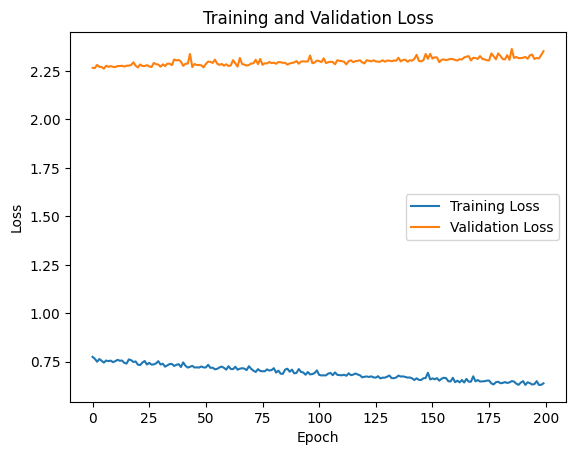

In [46]:
import matplotlib.pyplot as plt

# Plot training loss and validation loss
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.savefig('loss_plot_resnet50v2.jpg', format='jpg',dpi=600)
plt.show()

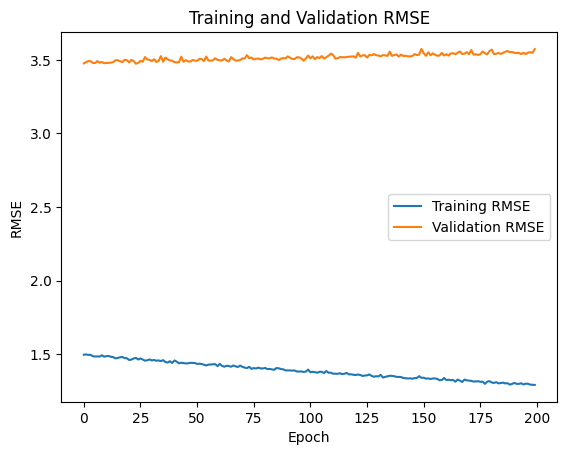

In [47]:
# Plot training RMSE and validation RMSE
plt.plot(history.history['rmse'], label='Training RMSE')
plt.plot(history.history['val_rmse'], label='Validation RMSE')
plt.title('Training and Validation RMSE')
plt.xlabel('Epoch')
plt.ylabel('RMSE')
plt.legend()
plt.savefig('rmse_plot_resnet50v2.jpg', format='jpg',dpi=600)
plt.show()

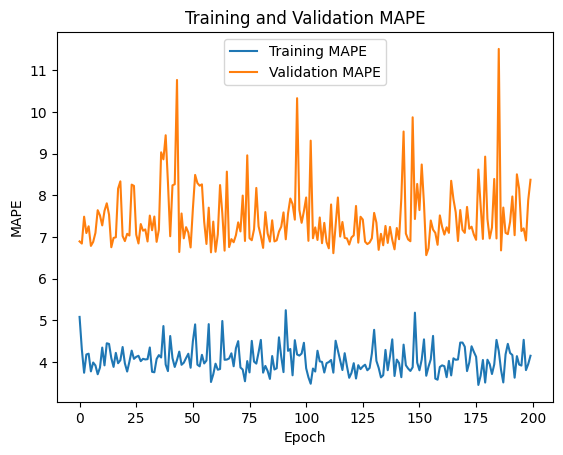

In [48]:
# Plot training MAPE and validation MAPE
plt.plot(history.history['mape'], label='Training MAPE')
plt.plot(history.history['val_mape'], label='Validation MAPE')
plt.title('Training and Validation MAPE')
plt.xlabel('Epoch')
plt.ylabel('MAPE')
plt.legend()
plt.savefig('mape_plot_resnet50v2.jpg', format='jpg',dpi=600)
plt.show()

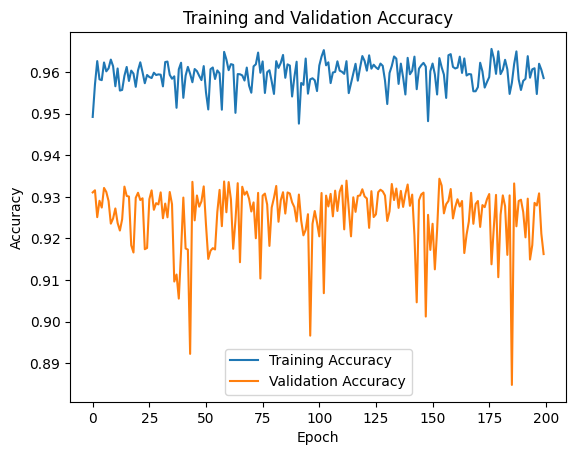

In [49]:
# Plot training Accuracy and validation Accuracy
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.savefig('accuracy_plot_resnet50v2.jpg', format='jpg',dpi=600)
plt.show()

Sample 1:
1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step
  Original - Gender: Male, Height: 177.80 cm, Weight: 78.00 kg, BMR: 1781.25 calories
  Predicted - Gender: Male, Height: 179.18 cm, Weight: 79.50 kg, BMR: 1804.87 calories



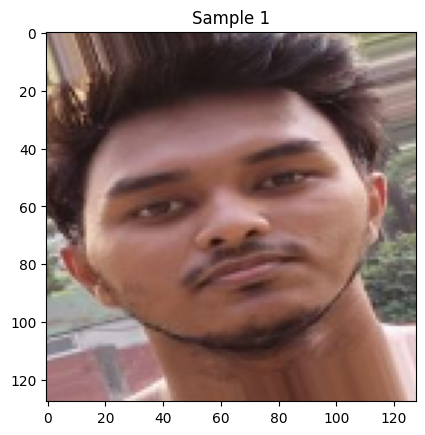

Sample 2:
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
  Original - Gender: Female, Height: 154.94 cm, Weight: 48.00 kg, BMR: 1172.38 calories
  Predicted - Gender: Female, Height: 160.73 cm, Weight: 48.18 kg, BMR: 1210.34 calories



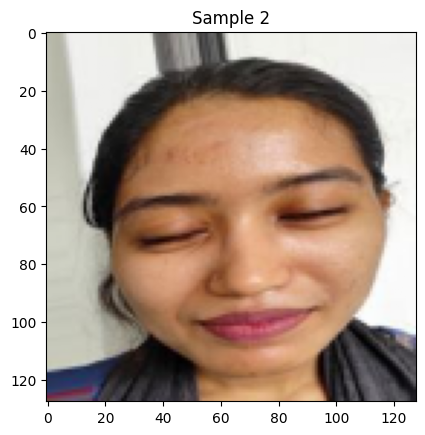

Sample 3:
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
  Original - Gender: Male, Height: 177.80 cm, Weight: 62.00 kg, BMR: 1621.25 calories
  Predicted - Gender: Male, Height: 169.03 cm, Weight: 65.76 kg, BMR: 1603.98 calories



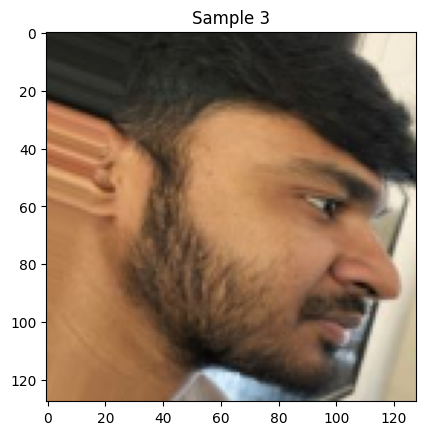

Sample 4:
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
  Original - Gender: Male, Height: 171.45 cm, Weight: 50.00 kg, BMR: 1461.56 calories
  Predicted - Gender: Male, Height: 175.06 cm, Weight: 49.57 kg, BMR: 1479.87 calories



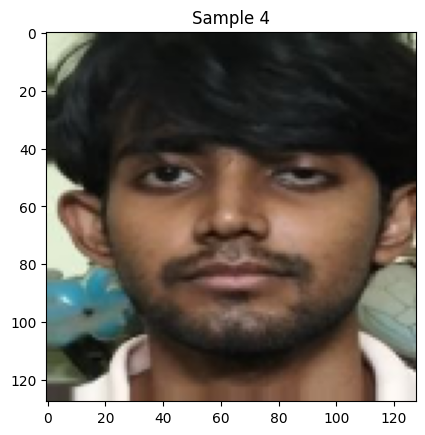

Sample 5:
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
  Original - Gender: Female, Height: 157.48 cm, Weight: 44.00 kg, BMR: 1148.25 calories
  Predicted - Gender: Female, Height: 149.45 cm, Weight: 40.04 kg, BMR: 1058.46 calories



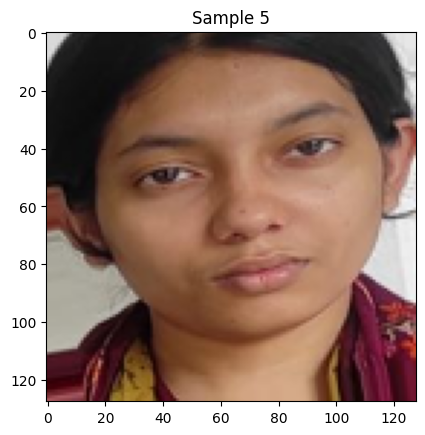

In [50]:
import numpy as np
import cv2
import pandas as pd
import os
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.layers import Flatten, Dense
from tensorflow.keras.models import Model
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt

# Define the calculate_bmr function
def calculate_bmr(gender_prob, weight, height, age):
    gender = 0 if gender_prob < 0.5 else 1
    if gender == 0:  # Assuming 0 represents Male
        bmr = 10 * weight + 6.25 * height - 5 * age + 5
    elif gender == 1:  # Assuming 1 represents Female
        bmr = 10 * weight + 6.25 * height - 5 * age - 161
    else:
        raise ValueError("Invalid gender value. Use 0 for Male, 1 for Female.")
    return bmr

# Lists to store original and predicted BMR, gender, height, and weight values
original_values_list = []
predicted_values_list = []

# Fixed age for calculation
age_for_calculation = 23

# Display original and predicted values for BMR, gender, height, and weight
for i in range(5):  # Adjust the number based on your preference
    print(f"Sample {i + 1}:")

    # Original values
    original_gender = "Male" if Y_test[i, 0] == 0 else "Female"
    original_height = Y_test[i, 1]
    original_weight = Y_test[i, 2]
    original_bmr = calculate_bmr(Y_test[i, 0], original_weight, original_height, age_for_calculation)

    original_values_list.append({
        'Gender': original_gender,
        'Height': original_height,
        'Weight': original_weight,
        'BMR': original_bmr
    })

    # Predicted values from your model
    predictions = model.predict(np.expand_dims(X_test[i], axis=0))
    predicted_gender_prob = predictions[0, 0]
    predicted_gender = "Male" if predicted_gender_prob < 0.5 else "Female"
    predicted_height = predictions[0, 1]
    predicted_weight = predictions[0, 2]

    # Calculate predicted BMR using predicted gender probability, height, weight, and fixed age
    predicted_bmr = calculate_bmr(predicted_gender_prob, predicted_weight, predicted_height, age_for_calculation)

    predicted_values_list.append({
        'Gender': predicted_gender,
        'Height': predicted_height,
        'Weight': predicted_weight,
        'BMR': predicted_bmr
    })

    # Display original and predicted values
    print(f"  Original - Gender: {original_gender}, Height: {original_height:.2f} cm, Weight: {original_weight:.2f} kg, BMR: {original_bmr:.2f} calories")
    print(f"  Predicted - Gender: {predicted_gender}, Height: {predicted_height:.2f} cm, Weight: {predicted_weight:.2f} kg, BMR: {predicted_bmr:.2f} calories")
    print()

    # Display the image
    plt.imshow(X_test[i])
    plt.title(f"Sample {i + 1}")
    plt.show()
